<a href="https://colab.research.google.com/github/biorsrch18/AML_Case-Studies/blob/main/AML_Project_LearnerNotebook_FullCode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
#!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
#!pip install --upgrade -q threadpoolctl

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [ ]:
# Installing the libraries with the specified version.
import warnings
warnings.filterwarnings("ignore")

# data manipulation
import numpy as np
import pandas as pd

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# to get different metric scores
from sklearn import metrics
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    recall_score,
    precision_score,
    f1_score,
    roc_auc_score,
    roc_curve)

# split data into train and test sets
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold

# handle missing datavalues
from sklearn.impute import SimpleImputer

# scaling data
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# to oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# to perform PCA
from sklearn.decomposition import PCA

# build linear regression model
from sklearn.linear_model import LinearRegression

# check regression model's performance
from sklearn.metrics import mean_squared_error, r2_score


# build decision tree model
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to perform model building
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier

# to perform hyperparameter tuning

from sklearn.base import BaseEstimator

class CustomModel(BaseEstimator):
    def __init__(self, param1=None):
        self.param1 = param1

    def fit(self, X, y):
        # Fit logic
        return self

    def predict(self, X):
        # Prediction logic
        return X

    def __sklearn_tags__(self):
        # Define required tags (if needed)
        return {}

from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import FunctionTransformer
wrapped_model = FunctionTransformer(lambda X: model.fit(X), validate=True)



from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, recall_score
scorer = make_scorer(accuracy_score)


## Loading the dataset

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data= pd.read_csv('/content/drive/MyDrive/AML/BankChurners.csv')

In [ ]:
df_churn= data.copy()

###Conversion to HTML

In [ ]:
!jupyter nbconvert --to html /content/drive/MyDrive/AML/AML_Project_LearnerNotebook_FullCode.ipynb

[NbConvertApp] Converting notebook /content/drive/MyDrive/AML/AML_Project_LearnerNotebook_FullCode.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 49 image(s).
[NbConvertApp] Writing 3650533 bytes to /content/drive/MyDrive/AML/AML_Project_LearnerNotebook_FullCode.html



## Data Overview

- Observations
- Sanity checks

In [ ]:
df_churn.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
df_churn.shape

(10127, 21)

In [ ]:
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
df_churn.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [ ]:
df_churn.describe(include='object').T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


In [ ]:
for i in df_churn.describe(include=["object"]).columns:
    print("Unique values in", i, "are :")
    print(df_churn[i].value_counts())
    print("*" * 50)

Unique values in Attrition_Flag are :
Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64
**************************************************
Unique values in Gender are :
Gender
F    5358
M    4769
Name: count, dtype: int64
**************************************************
Unique values in Education_Level are :
Education_Level
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64
**************************************************
Unique values in Marital_Status are :
Marital_Status
Married     4687
Single      3943
Divorced     748
Name: count, dtype: int64
**************************************************
Unique values in Income_Category are :
Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: count, dtype: int64
********************

##Observations:
There are 10127 rows and 21 columns in this dataframe.

Dataframe has 5- floating, 10-integer, and 6- object datatypes.

Clientnum has 10127 unique value so, it can be drpooed.

Average age of customer (Customer_Age) is approx.46 years, min age is 26 and max age is 73 years.

Dependent_count varies from 0 to 5.

Credit_Limit varies from 1438 to 34516 and standard deviation is 9088.7 which denotes data is highly skewed and have outliers.

Average_Open_to_Buy, Total_Amnt chng_Q4_Q1, Total_trans_Amnt, Total_ct_chng_Q4_Q1 columns also have skewed data and have outliers.

There are few customers with the revolving balance of maximum $2517 .


## Checking Missing and duplicate values


In [ ]:
df_churn.isnull().sum()

,0
CLIENTNUM,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0


In [ ]:
df_churn.duplicated().sum()

0

###Observations:
There are some missing values in Marital_Status and Education_level columns.

CLIENTNUM has unique values as number of rows so we can drop this column.

By categorical data encoding techniques, we can do changes in following columns:
- Attrition Flag
- Gender
- Marital_Status
- Education_level
- Income_Category
- Card_Category

To avoid Data leakage, we will impute the missing values after splitting the data into train, test and validation.

There are no duplicated values in the dataset.



In [ ]:
# Drop CLIENTNUM column
df_churn.drop(["CLIENTNUM"], axis=1, inplace=True)

In [ ]:
## Repalcing "Existing and Attrited customers" values by 0 and 1 using Onehot Encoding method to ease the analysis
df_churn["Attrition_Flag"].replace({'Existing Customer' : 0, 'Attrited Customer' : 1}, inplace=True)

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



## The below functions need to be defined to carry out the Exploratory Data Analysis.

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=df_churn, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=df_churn, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=df_churn, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        df_churn[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        df_churn[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(df_churn[feature])  # length of the column
    count = df_churn[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=df_churn,
        x=feature,
        palette="Paired",
        order=df_churn[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [ ]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = df_churn[predictor].nunique()
    sorter = df_churn[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], df_churn[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(df_churn[predictor], df_churn[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [ ]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=df_churn[df_churn[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=df_churn[df_churn[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=df_churn, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=df_churn,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

##Univariate and Bivariate analysis


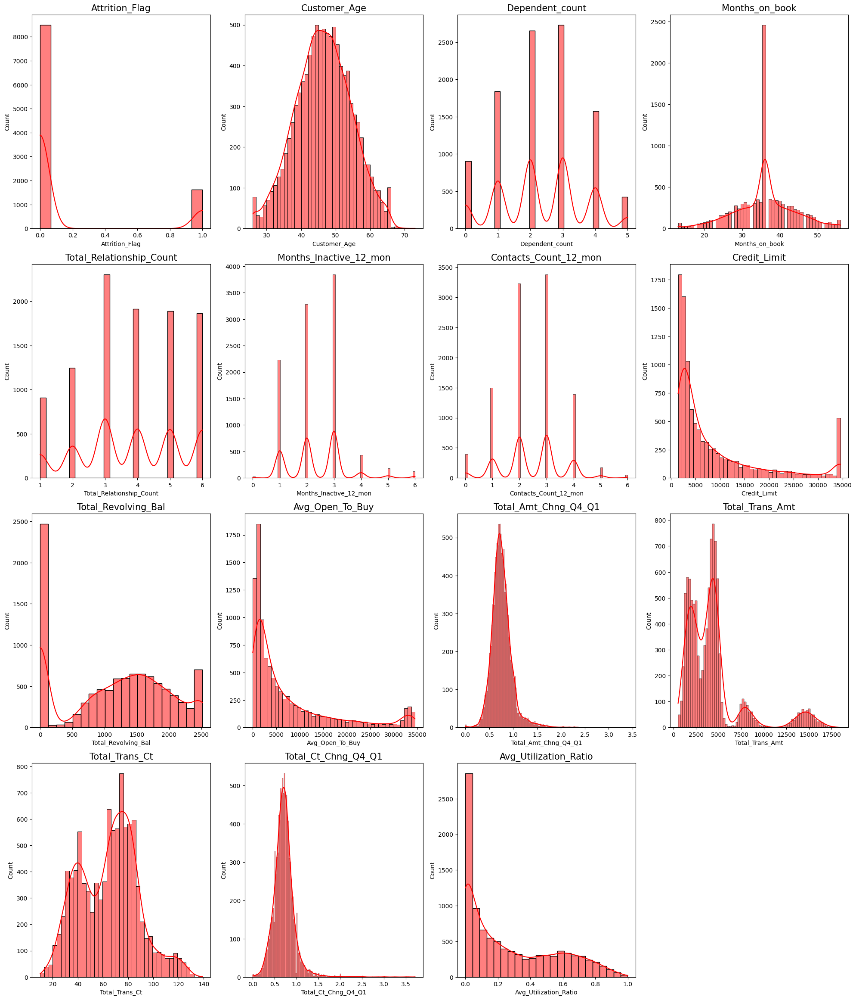

<Figure size 640x480 with 0 Axes>

In [ ]:
#viewing all the fields/columns plots together
co_all = df_churn.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(20,75))

for i in range(len(co_all)):
    plt.subplot(13, 4, i + 1)
    sns.histplot(df_churn[co_all[i]], kde=True, color='Red')
    plt.xlabel(co_all[i])
    plt.title(co_all[i], fontsize=15)
    plt.tight_layout()
plt.show()
plt.savefig('all_univariate_analysis.png')

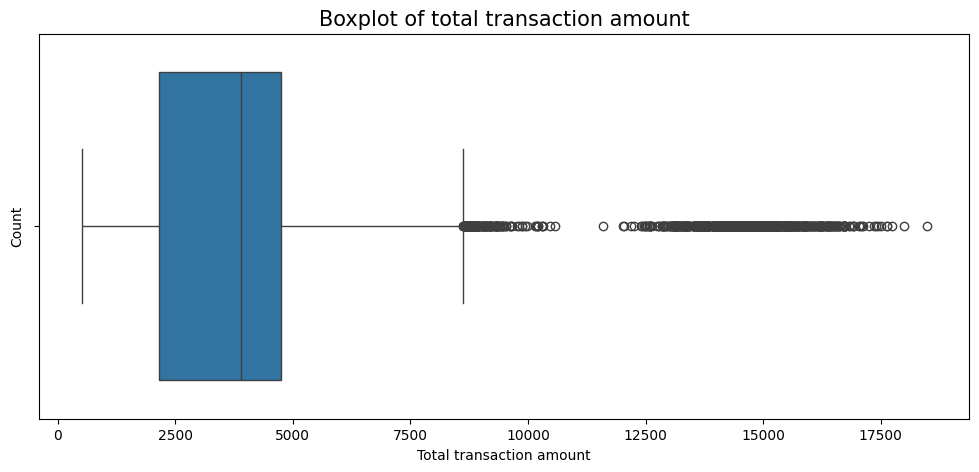

<Figure size 640x480 with 0 Axes>

In [ ]:
# Q1. How is the total transaction amount distributed?
#Boxplot of total transaction amount
plt.figure(figsize=(12, 5))
sns.boxplot(x=df_churn["Total_Trans_Amt"])
plt.title("Boxplot of total transaction amount", fontsize=15)
plt.xlabel("Total transaction amount")
plt.ylabel("Count")
plt.show()
plt.savefig("Boxplot of total transaction amount.png")

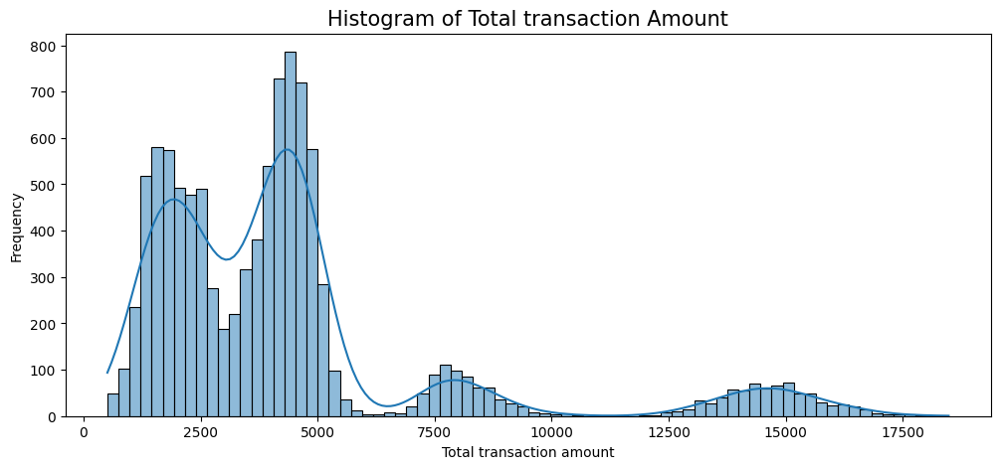

<Figure size 640x480 with 0 Axes>

In [ ]:
# Histogram of Total transaction Amount
plt.figure(figsize=(12, 5))
sns.histplot(data=df_churn, x="Total_Trans_Amt", kde=True)
plt.title("Histogram of Total transaction Amount", fontsize=15)
plt.xlabel("Total transaction amount")
plt.ylabel("Frequency")
plt.show()
plt.savefig("Histogram of Total transaction Amount.png")

<Figure size 1200x500 with 0 Axes>

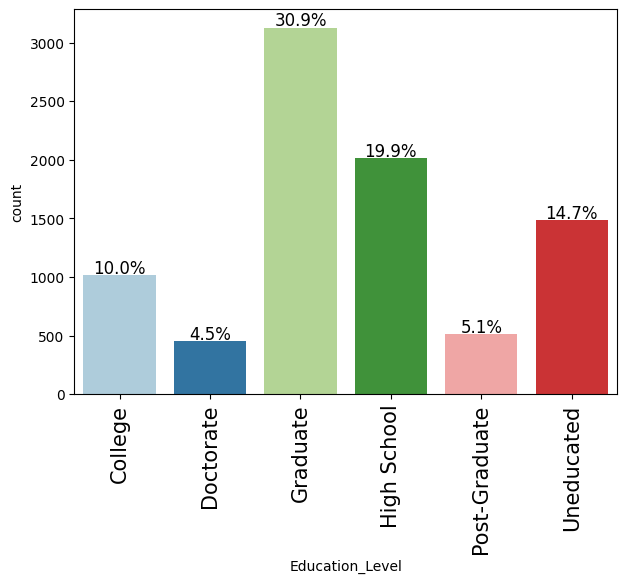

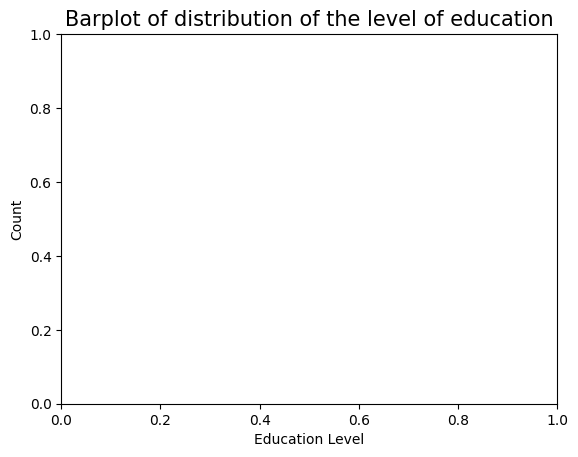

<Figure size 640x480 with 0 Axes>

In [ ]:
# Q2. What is the distribution of the level of education of customers?
# Barplot of distribution of the level of education
plt.figure(figsize=(12, 5))
labeled_barplot(df_churn, 'Education_Level', perc=True)
plt.title("Barplot of distribution of the level of education", fontsize=15)
plt.xlabel("Education Level")
plt.ylabel("Count")
plt.show()
plt.savefig("Barplot of distribution of the level of education.png");

<Figure size 1200x500 with 0 Axes>

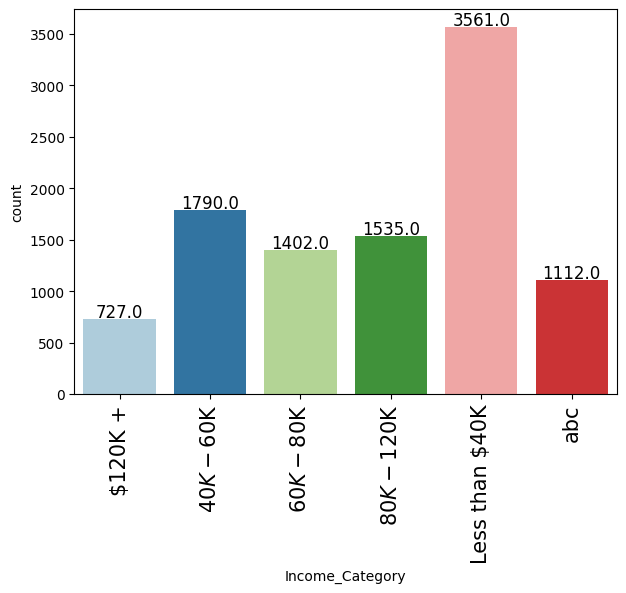

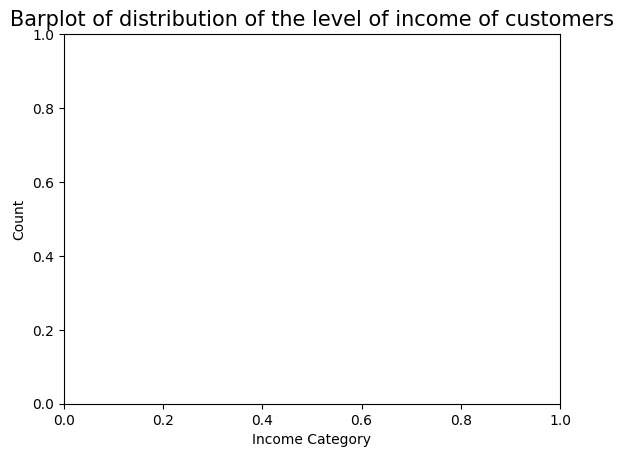

<Figure size 640x480 with 0 Axes>

In [ ]:
#Q3. What is the distribution of the level of income of customers?
# # Barplot of distribution of the level of income of customers
plt.figure(figsize=(12, 5))
labeled_barplot(df_churn, 'Income_Category')
plt.title("Barplot of distribution of the level of income of customers", fontsize=15)
plt.xlabel("Income Category")
plt.ylabel("Count")
plt.show()
plt.savefig("Barplot of distribution of the level of income of customers.png");

<Figure size 1200x500 with 0 Axes>

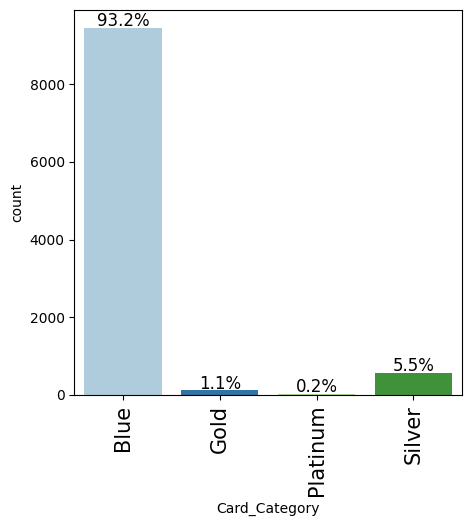

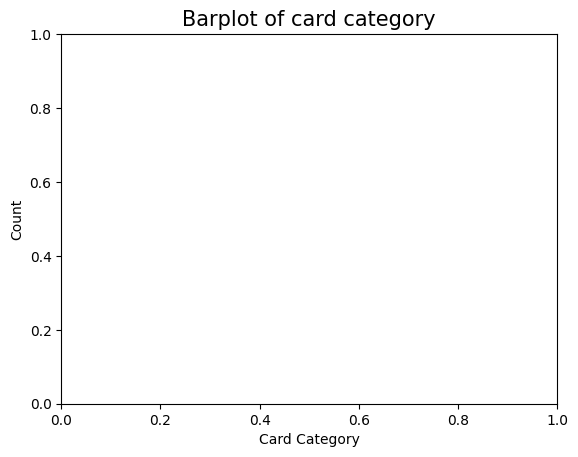

<Figure size 640x480 with 0 Axes>

In [ ]:
# barplot of card category
plt.figure(figsize=(12, 5))
labeled_barplot(df_churn, 'Card_Category', perc=True)
plt.title("Barplot of card category", fontsize=15)
plt.xlabel("Card Category")
plt.ylabel("Count")
plt.show()
plt.savefig("Barplot of card category.png");

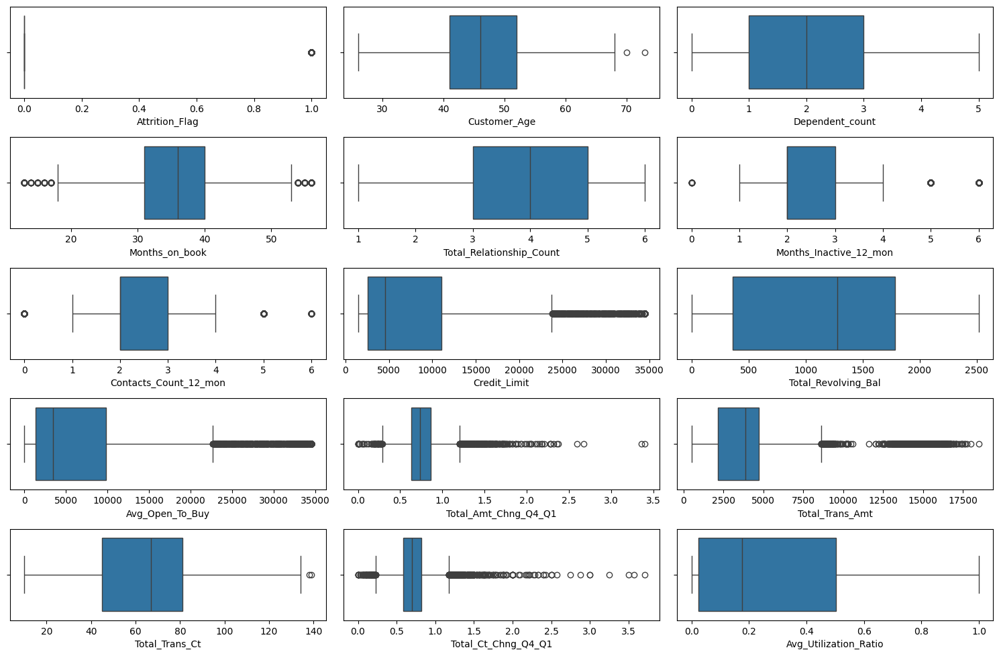

<Figure size 640x480 with 0 Axes>

In [ ]:
# Q4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
# Outlier Detection
features = df_churn.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(15,25))
for i, feature in enumerate(features):
    plt.subplot(13,3,i+1)
    sns.boxplot(data= df_churn, x= feature)
    plt.xlabel(feature)
    plt.tight_layout()
plt.show()
plt.savefig('outlier_detection.png');

In [ ]:
# Select on numeric columns_df_churn
numeric_df = df_churn.select_dtypes(include=["float64", "int64"])

# Q1, Q3 & IQR calculation
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1
print('Q1:\n', Q1)
print('Q3:\n', Q3)
print('IQR:\n', IQR)

# Outlier detection
lower = (Q1 - 1.5 * IQR)
upper = (Q3 + 1.5 * IQR)
outliers = ((numeric_df < lower) | (numeric_df > upper)).sum()
percentage_outliers = (outliers / len(df_churn)) * 100
print('Percentage of outliers in each column:', percentage_outliers)

Q1:
 Attrition_Flag                 0.000
Customer_Age                  41.000
Dependent_count                1.000
Months_on_book                31.000
Total_Relationship_Count       3.000
Months_Inactive_12_mon         2.000
Contacts_Count_12_mon          2.000
Credit_Limit                2555.000
Total_Revolving_Bal          359.000
Avg_Open_To_Buy             1324.500
Total_Amt_Chng_Q4_Q1           0.631
Total_Trans_Amt             2155.500
Total_Trans_Ct                45.000
Total_Ct_Chng_Q4_Q1            0.582
Avg_Utilization_Ratio          0.023
Name: 0.25, dtype: float64
Q3:
 Attrition_Flag                  0.000
Customer_Age                   52.000
Dependent_count                 3.000
Months_on_book                 40.000
Total_Relationship_Count        5.000
Months_Inactive_12_mon          3.000
Contacts_Count_12_mon           3.000
Credit_Limit                11067.500
Total_Revolving_Bal          1784.000
Avg_Open_To_Buy              9859.000
Total_Amt_Chng_Q4_Q1        

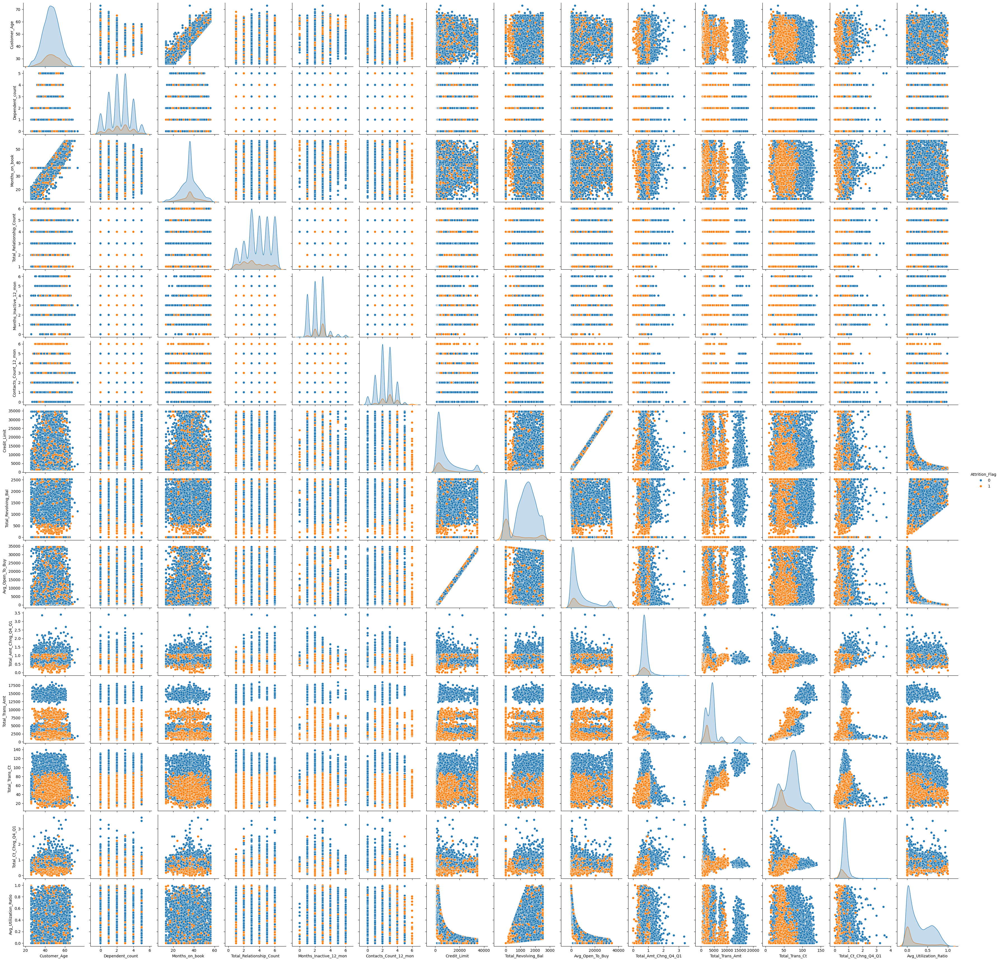

<Figure size 640x480 with 0 Axes>

In [ ]:
sns.pairplot(df_churn, hue='Attrition_Flag')
plt.show()
plt.savefig('pairplot.png');

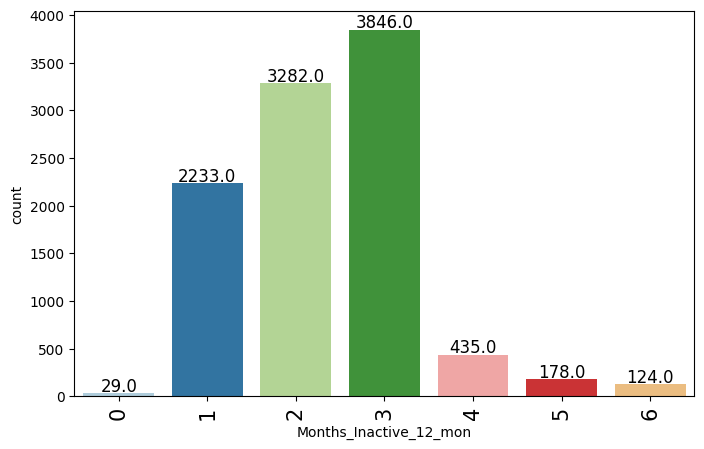

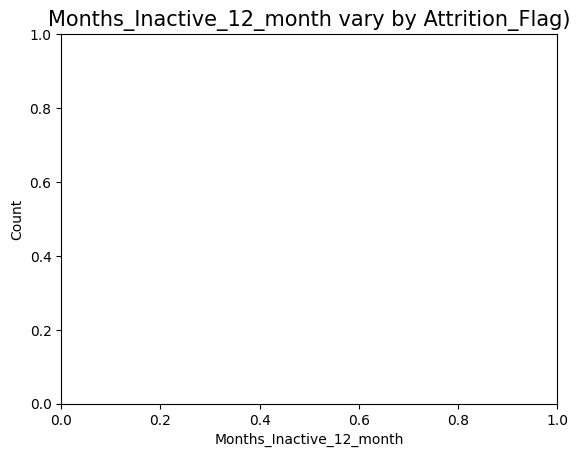

<Figure size 640x480 with 0 Axes>

In [ ]:
#Q5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
labeled_barplot(df_churn, 'Months_Inactive_12_mon')
plt.title("Months_Inactive_12_month vary by Attrition_Flag)", fontsize=15)
plt.xlabel("Months_Inactive_12_month")
plt.ylabel("Count")
plt.show()
plt.savefig("Months_Inactive_12_month vary by Attrition_Flag.png");


In [ ]:
df_churn['Gender'] = df_churn['Gender'].astype('category')
df_churn['Education_Level'] = df_churn['Education_Level'].astype('category')
df_churn['Marital_Status'] = df_churn['Marital_Status'].astype('category')
df_churn['Income_Category'] = df_churn['Income_Category'].astype('category')
df_churn['Card_Category'] = df_churn['Card_Category'].astype('category')

In [ ]:
nu_df = df_churn.copy()

In [ ]:
Gender = {'M' : 0, 'F' : 1}
nu_df['Gender'] = nu_df['Gender'].map(Gender)

Education_Level = {'Uneducated' : 0, 'High School' : 1, 'College' : 2, 'Graduate' : 3, 'Post-Graduate' : 4, 'Doctorate' : 5}
nu_df['Education_Level'] = nu_df['Education_Level'].map(Education_Level)

Marital_Status = {'Single' : 0, 'Married' : 1, 'Divorced' : 2}
nu_df['Marital_Status'] = nu_df['Marital_Status'].map(Marital_Status)

Income_Category = {'abc' : 0, 'Less than $40K' : 1, '$40K - $60K' : 2, '$60K - $80K' : 3, '$80K - $120K' : 4, '$120K +' : 5}
nu_df['Income_Category'] = nu_df['Income_Category'].map(Income_Category)

Card_Category = {'Blue' : 0, 'Silver' : 1, 'Gold' : 2, 'Platinu_dfm' : 3}
nu_df['Card_Category'] = nu_df['Card_Category'].map(Card_Category)

In [ ]:
nu_df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,0,3,1,1,3,0.0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,1,5,3,0,1,0.0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,0,3,3,1,4,0.0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,1,4,1,NaN,1,0.0,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,0,3,0,1,3,0.0,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
nu_df.corr()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,1.000000,0.018203,0.037272,0.018991,0.020725,-0.017209,-0.013577,-0.002014,0.013687,-0.150005,0.152449,0.204491,-0.023873,-0.263053,-0.000285,-0.131063,-0.168598,-0.371403,-0.290054,-0.178410
Customer_Age,0.018203,1.000000,0.017312,-0.122254,0.001537,-0.005658,0.023508,-0.022547,0.788912,-0.010931,0.054361,-0.018452,0.002476,0.014780,0.001151,-0.062042,-0.046446,-0.067097,-0.012143,0.007114
Gender,0.037272,0.017312,1.000000,-0.004563,0.011401,-0.009322,-0.786608,-0.084040,0.006728,-0.003157,0.011163,-0.039987,-0.420806,-0.029658,-0.418059,-0.026712,-0.024890,0.067454,0.005800,0.257851
Dependent_count,0.018991,-0.122254,-0.004563,1.000000,0.005170,0.031115,0.066278,0.031593,-0.103062,-0.039076,-0.010768,-0.040505,0.068065,-0.002688,0.068291,-0.035439,0.025046,0.049912,0.011087,-0.037135
Education_Level,0.020725,0.001537,0.011401,0.005170,1.000000,0.002251,-0.011100,0.010379,0.006069,-0.002538,-0.003122,-0.008147,-0.009218,-0.010742,-0.008249,-0.011956,-0.008759,-0.007916,-0.022937,-0.000434
Marital_Status,-0.017209,-0.005658,-0.009322,0.031115,0.002251,1.000000,0.015557,-0.039118,-0.004219,0.020483,-0.006033,-0.009105,-0.021185,0.031334,-0.024005,0.036000,-0.037316,-0.076492,0.002471,0.020509
Income_Category,-0.013577,0.023508,-0.786608,0.066278,-0.011100,0.015557,1.000000,0.081329,0.022122,-0.003202,-0.016310,0.023113,0.475972,0.034718,0.472760,0.011352,0.019651,-0.054569,-0.012657,-0.246476
Card_Category,-0.002014,-0.022547,-0.084040,0.031593,0.010379,-0.039118,0.081329,1.000000,-0.014368,-0.083960,-0.014194,-0.001239,0.492874,0.026150,0.490372,0.006291,0.188057,0.128366,-0.004255,-0.200070
Months_on_book,0.013687,0.788912,0.006728,-0.103062,0.006069,-0.004219,0.022122,-0.014368,1.000000,-0.009203,0.074164,-0.010774,0.007507,0.008623,0.006732,-0.048959,-0.038591,-0.049819,-0.014072,-0.007541
Total_Relationship_Count,-0.150005,-0.010931,-0.003157,-0.039076,-0.002538,0.020483,-0.003202,-0.083960,-0.009203,1.000000,-0.003675,0.055203,-0.071386,0.013726,-0.072601,0.050119,-0.347229,-0.241891,0.040831,0.067663


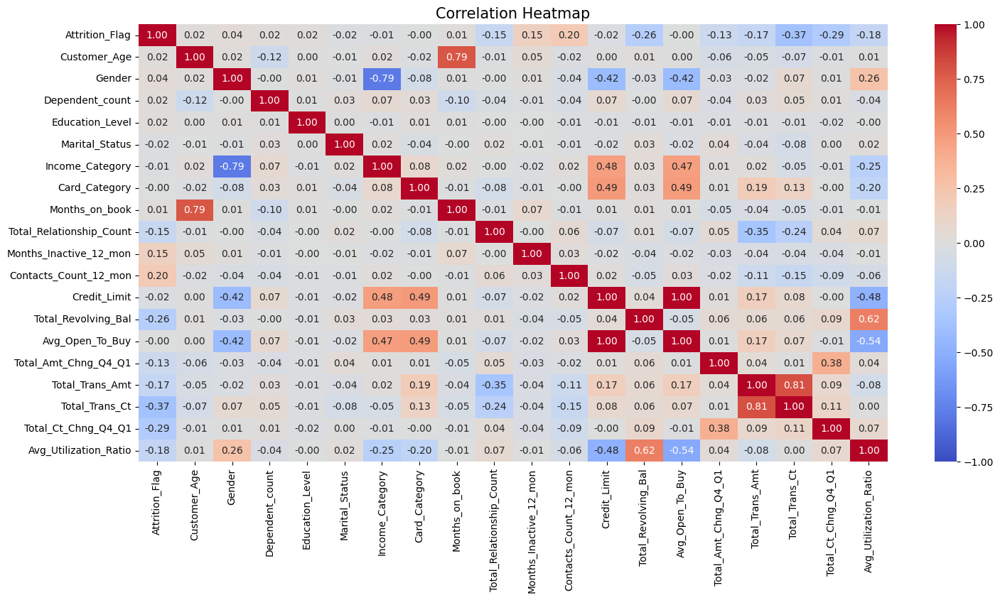

<Figure size 640x480 with 0 Axes>

In [ ]:
#Q6. What are the attributes that have a strong correlation with each other?

plt.figure(figsize=(17, 8))
sns.heatmap(nu_df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Heatmap", fontsize=15)
plt.show()
plt.savefig("Correlation Heatmap.png")

##Observations:

Avg_Open_to_buy is highly correlated to credit limit with value 1.0.
Months_on_book is also related to customer's Age (0.79)


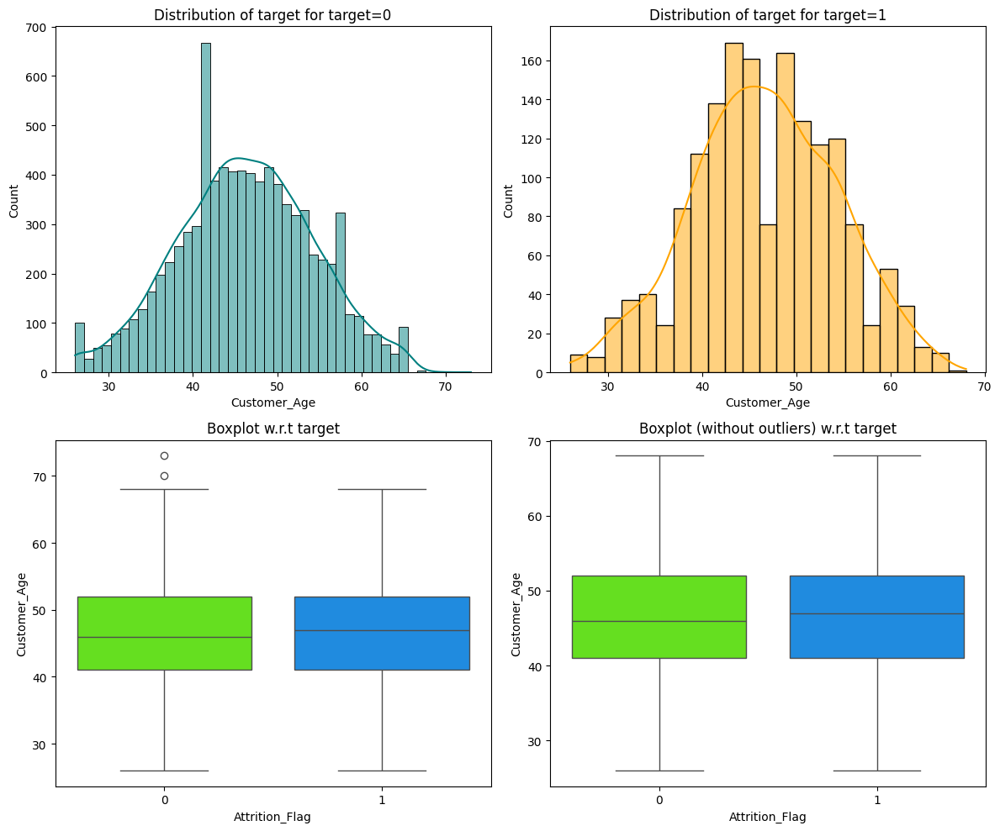

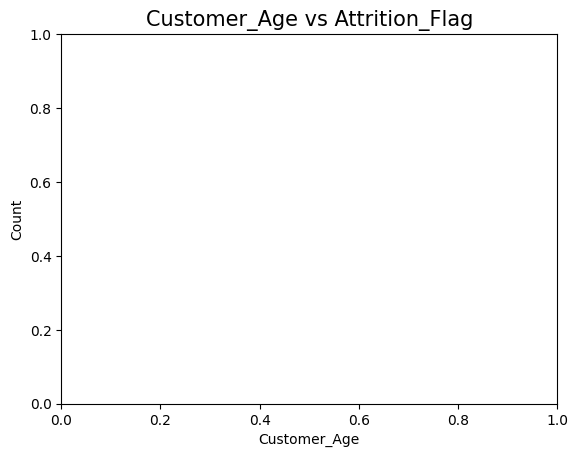

<Figure size 640x480 with 0 Axes>

In [ ]:
#distribution plot between Attrition_Flag and Customer_Age
distribution_plot_wrt_target(df_churn, "Customer_Age", "Attrition_Flag")
plt.title("Customer_Age vs Attrition_Flag", fontsize=15)
plt.xlabel("Customer_Age")
plt.ylabel("Count")
plt.show()
plt.savefig("Customer_Age vs Attrition_Flag.png");

Attrition_Flag     0     1    All
Gender                           
All             8500  1627  10127
F               4428   930   5358
M               4072   697   4769
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x500 with 0 Axes>

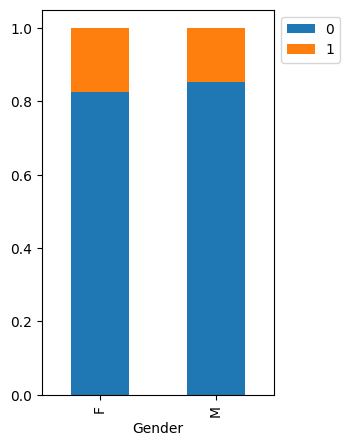

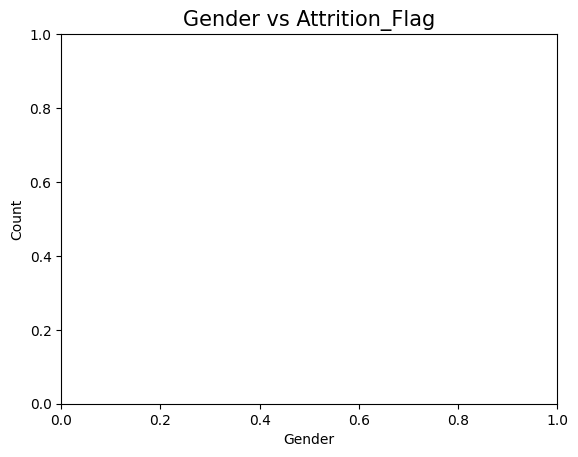

<Figure size 640x480 with 0 Axes>

In [ ]:
#plot between Attrition_Flag and Gender
plt.figure(figsize=(10, 5))
stacked_barplot(df_churn, "Gender", "Attrition_Flag")
plt.title("Gender vs Attrition_Flag", fontsize=15)
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()
plt.savefig("Gender vs Attrition_Flag.png");

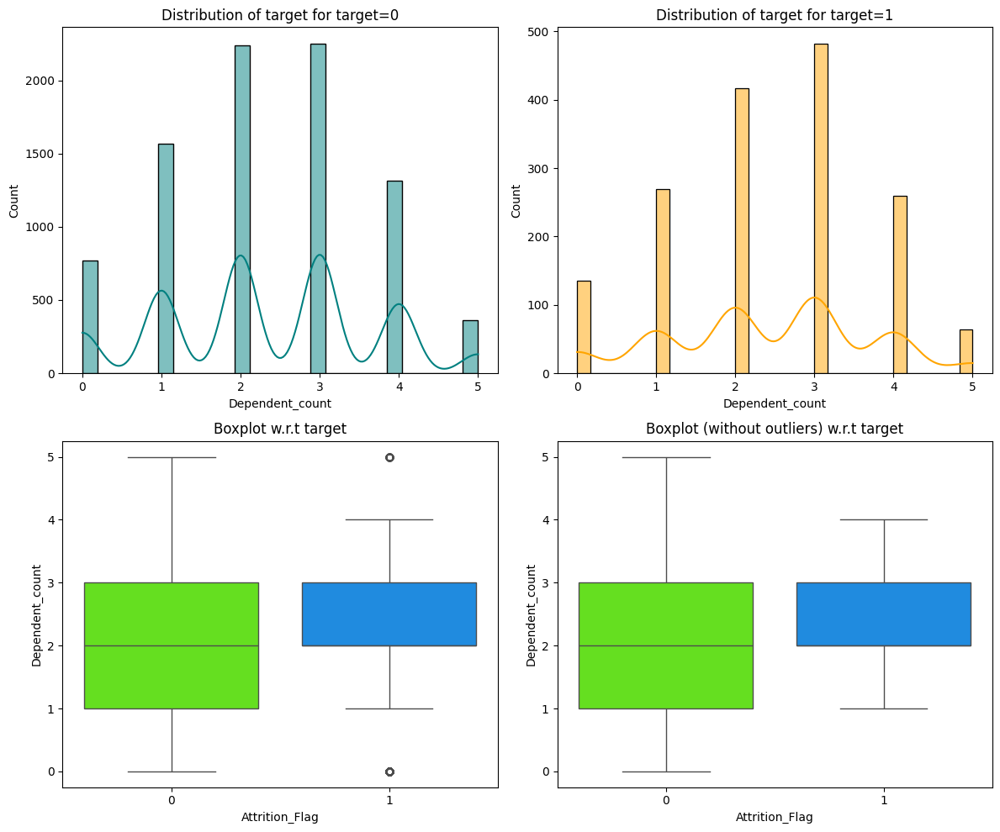

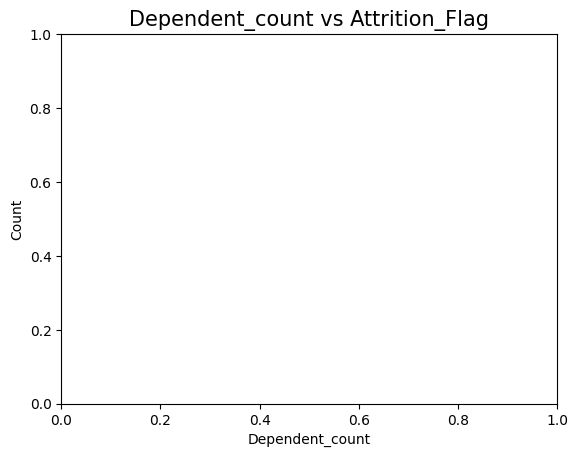

<Figure size 640x480 with 0 Axes>

In [ ]:
#distribution plot between Attrition_Flag and Dependendent_Count
distribution_plot_wrt_target(df_churn, "Dependent_count", "Attrition_Flag")
plt.title("Dependent_count vs Attrition_Flag", fontsize=15)
plt.xlabel("Dependent_count")
plt.ylabel("Count")
plt.show()
plt.savefig("Dependent_count vs Attrition_Flag.png");

Attrition_Flag      0     1   All
Education_Level                  
All              7237  1371  8608
Graduate         2641   487  3128
High School      1707   306  2013
Uneducated       1250   237  1487
College           859   154  1013
Doctorate         356    95   451
Post-Graduate     424    92   516
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x500 with 0 Axes>

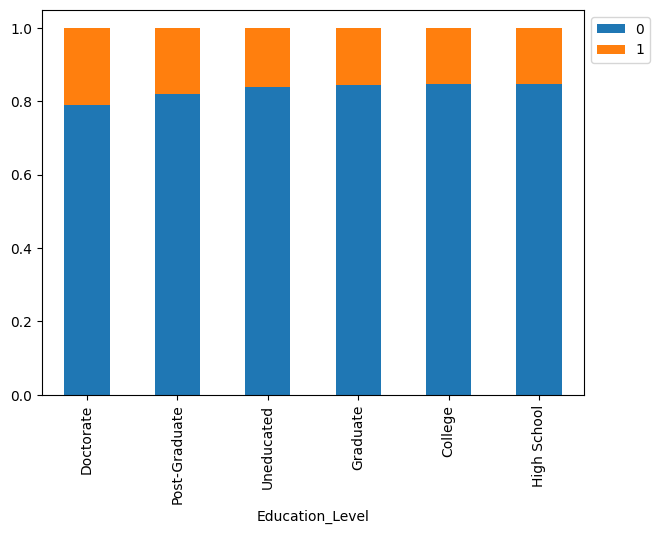

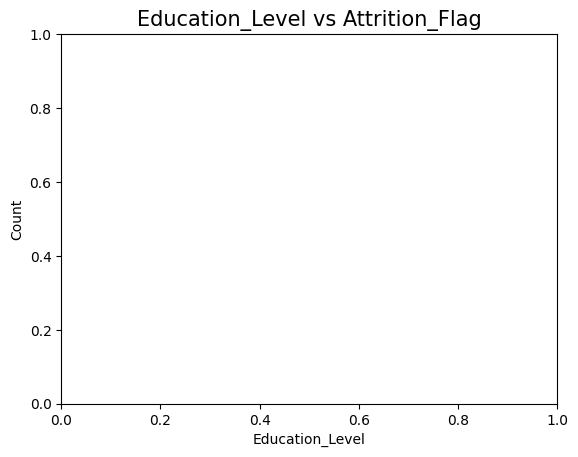

<Figure size 640x480 with 0 Axes>

In [ ]:
#Plot between Attrition_Flag and Educational_Level
plt.figure(figsize=(10, 5))
stacked_barplot(df_churn, "Education_Level", "Attrition_Flag")
plt.title("Education_Level vs Attrition_Flag", fontsize=15)
plt.xlabel("Education_Level")
plt.ylabel("Count")
plt.show()
plt.savefig("Education_Level vs Attrition_Flag.png");

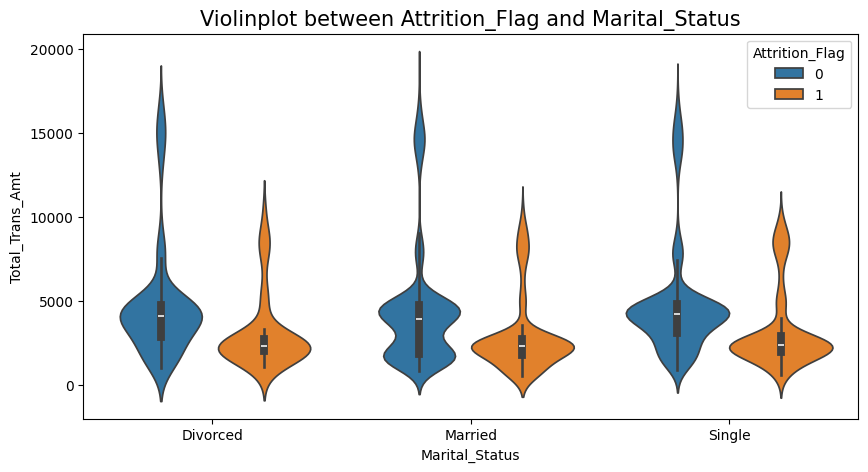

In [ ]:
# violinplot between Attrition_Flag and Marital_Status
plt.figure(figsize=(10, 5))
sns.violinplot(data=df_churn, x="Marital_Status", y="Total_Trans_Amt", hue="Attrition_Flag")
plt.title("Violinplot between Attrition_Flag and Marital_Status", fontsize=15)
plt.xlabel("Marital_Status")
plt.ylabel("Total_Trans_Amt")
plt.show()

Attrition_Flag      0     1    All
Income_Category                   
All              8500  1627  10127
Less than $40K   2949   612   3561
$40K - $60K      1519   271   1790
$80K - $120K     1293   242   1535
$60K - $80K      1213   189   1402
abc               925   187   1112
$120K +           601   126    727
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x500 with 0 Axes>

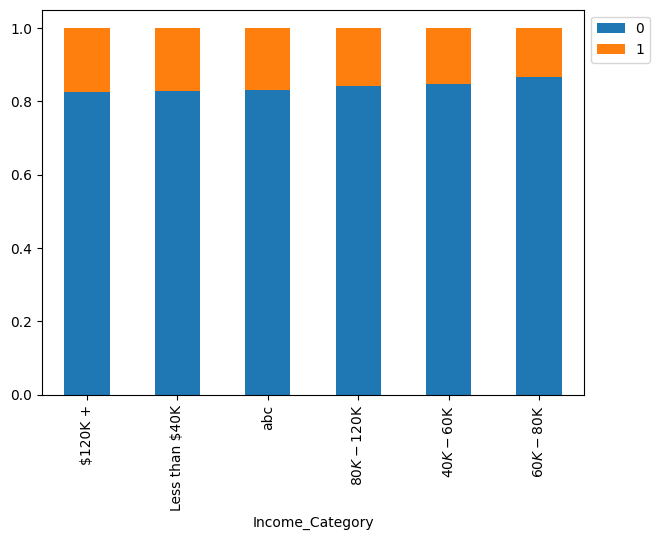

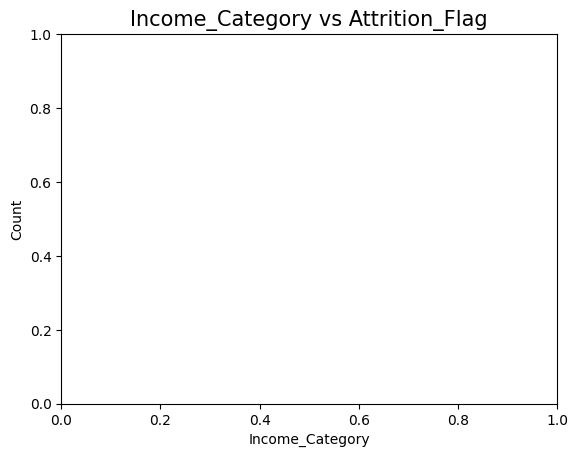

<Figure size 640x480 with 0 Axes>

In [ ]:
# Relation between Attrition_Flag and Income_category
plt.figure(figsize=(10, 5))
stacked_barplot(df_churn, "Income_Category", "Attrition_Flag")
plt.title("Income_Category vs Attrition_Flag", fontsize=15)
plt.xlabel("Income_Category")
plt.ylabel("Count")
plt.show()
plt.savefig("Income_Category vs Attrition_Flag.png");

Attrition_Flag     0     1    All
Card_Category                    
All             8500  1627  10127
Blue            7917  1519   9436
Silver           473    82    555
Gold              95    21    116
Platinum          15     5     20
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x500 with 0 Axes>

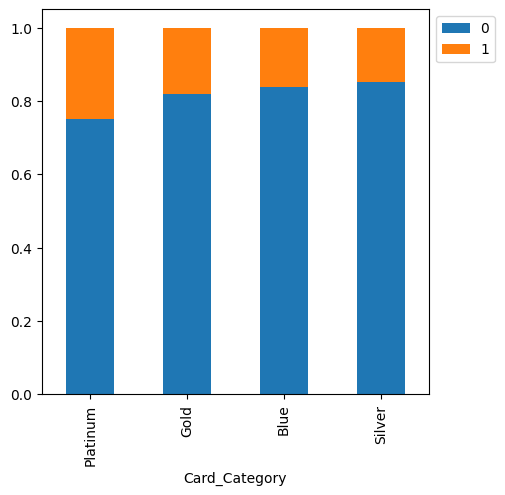

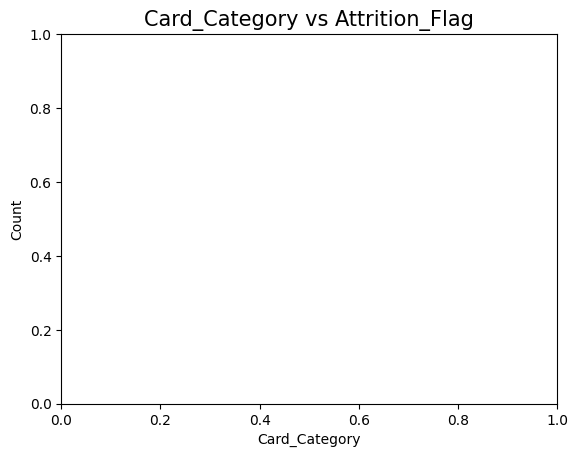

<Figure size 640x480 with 0 Axes>

In [ ]:
# Relation between Attrition_Flag and Card_Category
plt.figure(figsize=(10, 5))
stacked_barplot(df_churn, "Card_Category", "Attrition_Flag")
plt.title("Card_Category vs Attrition_Flag", fontsize=15)
plt.xlabel("Card_Category")
plt.ylabel("Count")
plt.show()
plt.savefig("Card_Category vs Attrition_Flag.png");

Attrition_Flag               0     1    All
Total_Relationship_Count                   
All                       8500  1627  10127
3                         1905   400   2305
2                          897   346   1243
1                          677   233    910
5                         1664   227   1891
4                         1687   225   1912
6                         1670   196   1866
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x500 with 0 Axes>

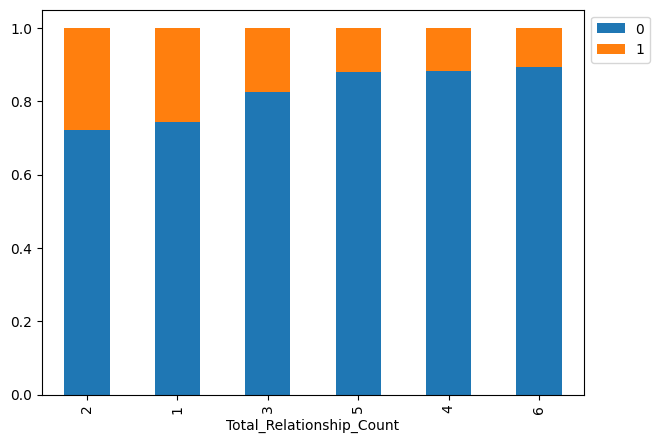

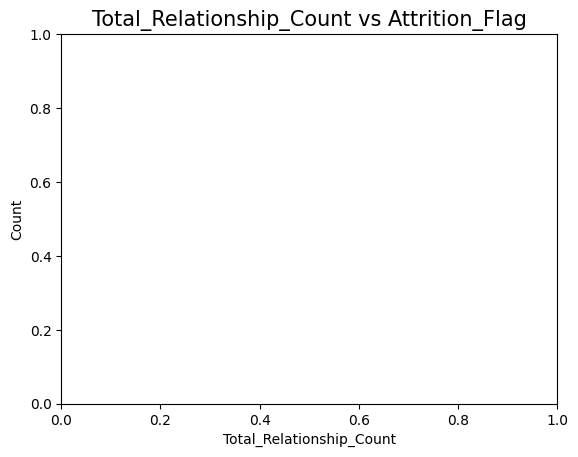

<Figure size 640x480 with 0 Axes>

In [ ]:
# Relation between Attrition_Flag and Total_Relationship_Count
plt.figure(figsize=(10, 5))
stacked_barplot(df_churn, "Total_Relationship_Count", "Attrition_Flag")
plt.title("Total_Relationship_Count vs Attrition_Flag", fontsize=15)
plt.xlabel("Total_Relationship_Count")
plt.ylabel("Count")
plt.show()
plt.savefig("Total_Relationship_Count vs Attrition_Flag.png");

Attrition_Flag             0     1    All
Months_Inactive_12_mon                   
All                     8500  1627  10127
3                       3020   826   3846
2                       2777   505   3282
4                        305   130    435
1                       2133   100   2233
5                        146    32    178
6                        105    19    124
0                         14    15     29
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x500 with 0 Axes>

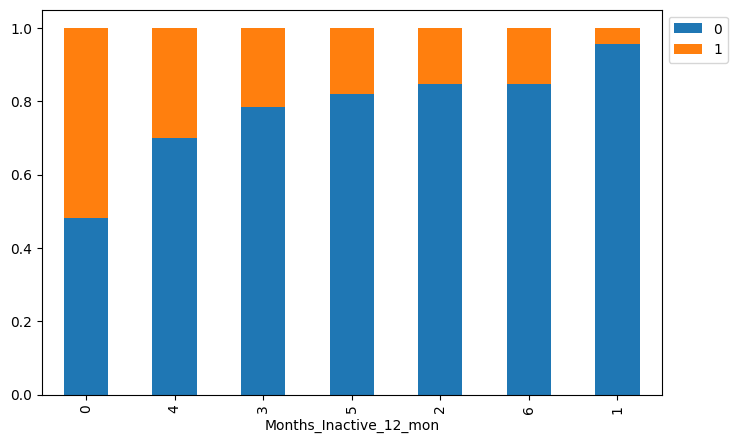

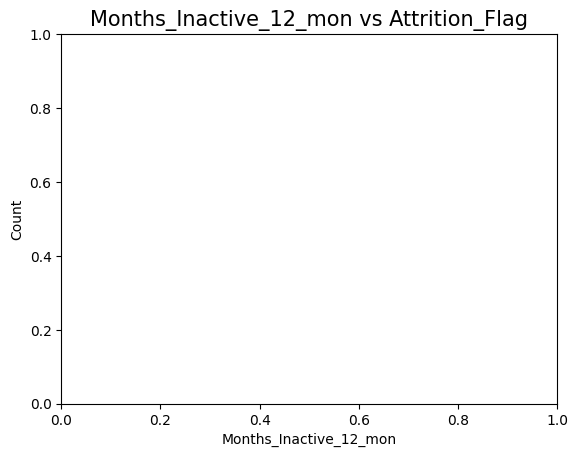

<Figure size 640x480 with 0 Axes>

In [ ]:
# Relation between Attrition_Flag and Months_Inactive_12_mon
plt.figure(figsize=(10, 5))
stacked_barplot(df_churn, "Months_Inactive_12_mon", "Attrition_Flag")
plt.title("Months_Inactive_12_mon vs Attrition_Flag", fontsize=15)
plt.xlabel("Months_Inactive_12_mon")
plt.ylabel("Count")
plt.show()
plt.savefig("Months_Inactive_12_mon vs Attrition_Flag.png");

Attrition_Flag            0     1    All
Contacts_Count_12_mon                   
All                    8500  1627  10127
3                      2699   681   3380
2                      2824   403   3227
4                      1077   315   1392
1                      1391   108   1499
5                       117    59    176
6                         0    54     54
0                       392     7    399
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x500 with 0 Axes>

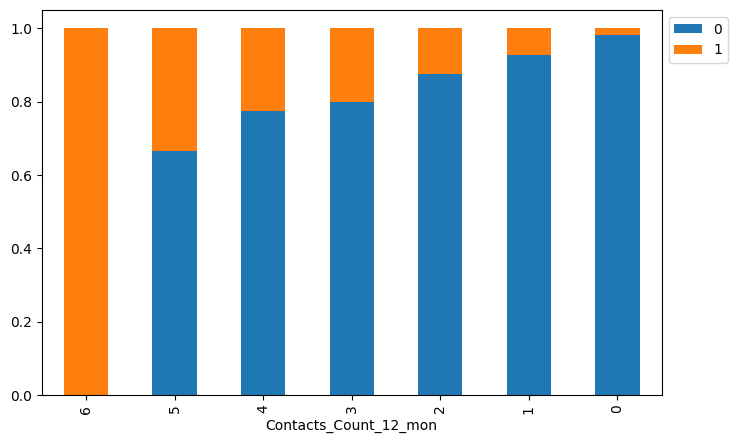

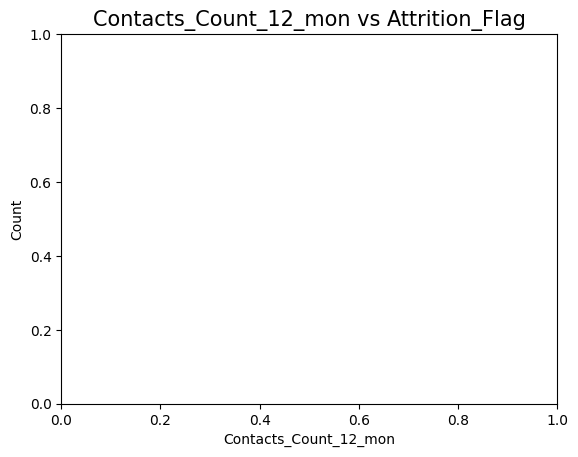

<Figure size 640x480 with 0 Axes>

In [ ]:
# Relation between Attrition_Flag and Contacts_Count_12_mon
plt.figure(figsize=(10, 5))
stacked_barplot(df_churn, "Contacts_Count_12_mon", "Attrition_Flag")
plt.title("Contacts_Count_12_mon vs Attrition_Flag", fontsize=15)
plt.xlabel("Contacts_Count_12_mon")
plt.ylabel("Count")
plt.show()
plt.savefig("Contacts_Count_12_mon vs Attrition_Flag.png");

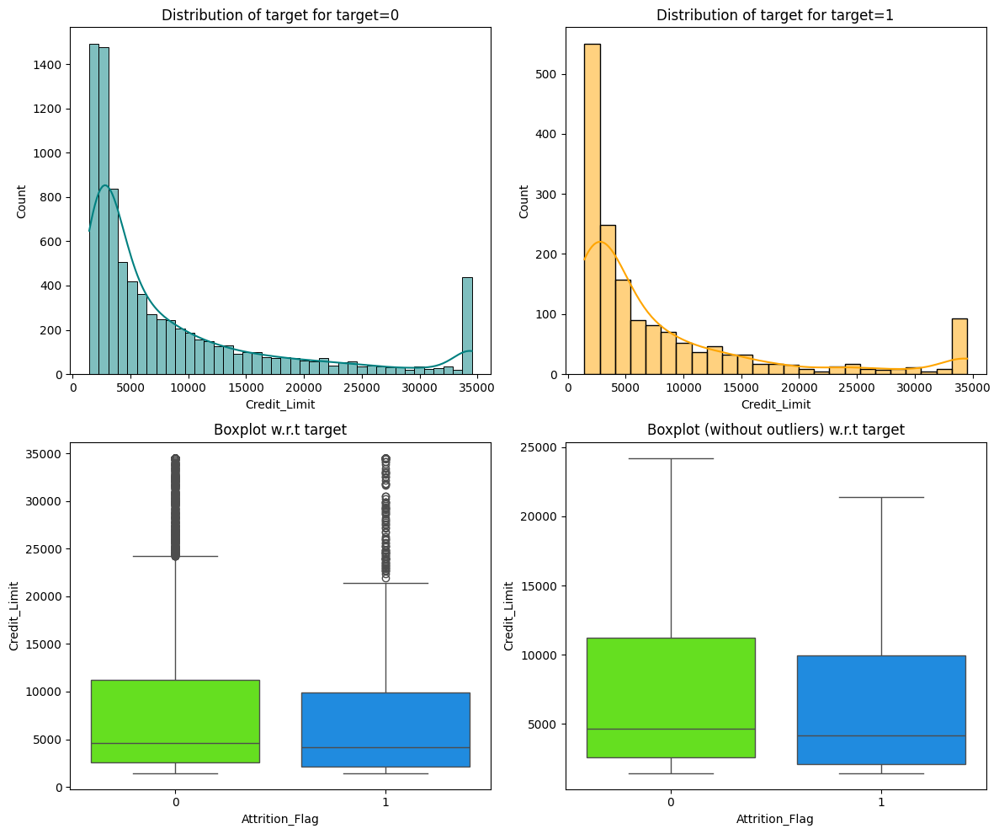

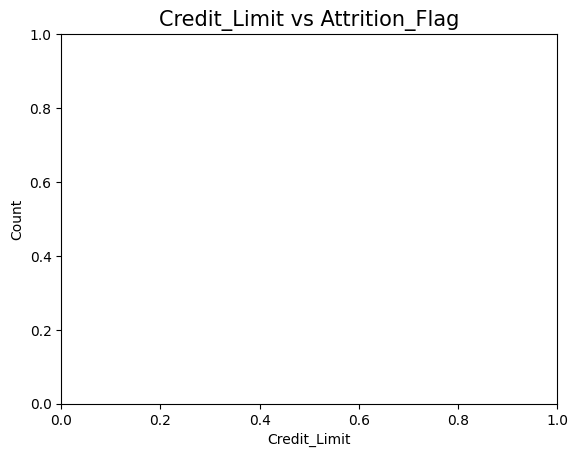

<Figure size 640x480 with 0 Axes>

In [ ]:
# Distribution plot between Attrition_Flag and Credit_Limit
distribution_plot_wrt_target(df_churn, "Credit_Limit", "Attrition_Flag")
plt.title("Credit_Limit vs Attrition_Flag", fontsize=15)
plt.xlabel("Credit_Limit")
plt.ylabel("Count")
plt.show()
plt.savefig("Credit_Limit vs Attrition_Flag.png");


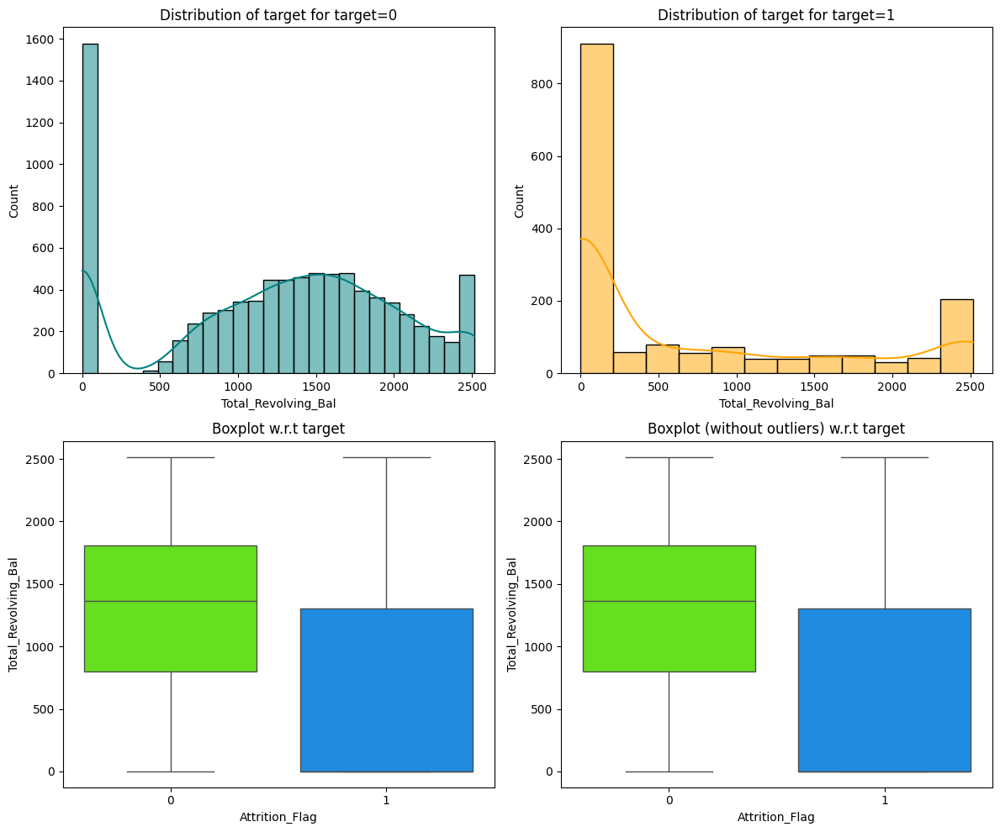

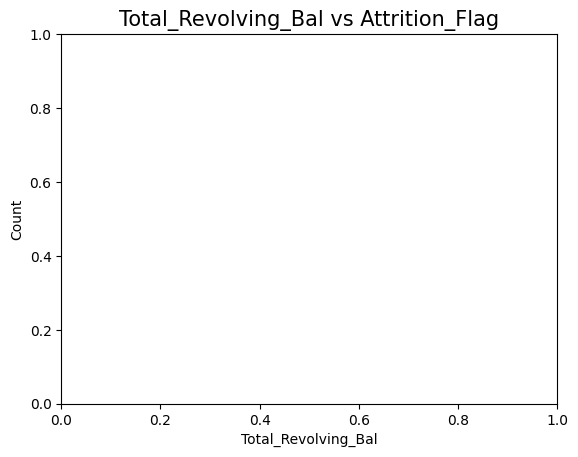

<Figure size 640x480 with 0 Axes>

In [ ]:
# Distribution plot between Attrition_Flag and Total_Revolving_Bal
distribution_plot_wrt_target(df_churn, "Total_Revolving_Bal", "Attrition_Flag")
plt.title("Total_Revolving_Bal vs Attrition_Flag", fontsize=15)
plt.xlabel("Total_Revolving_Bal")
plt.ylabel("Count")
plt.show()
plt.savefig("Total_Revolving_Bal vs Attrition_Flag.png");


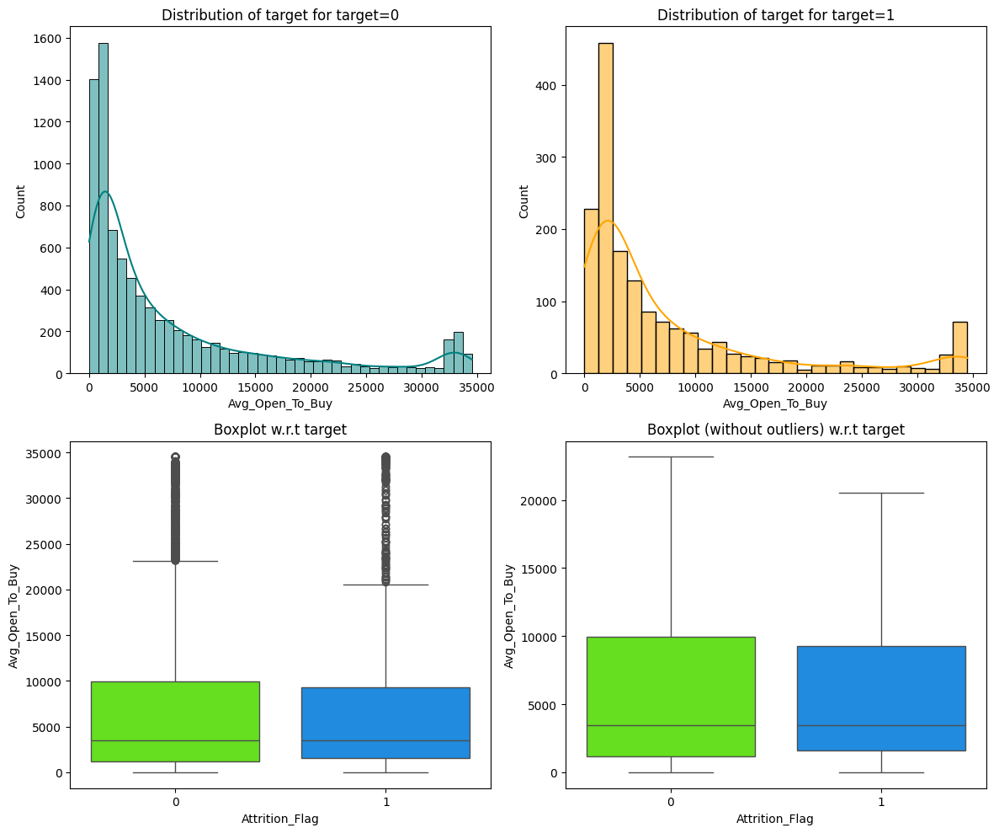

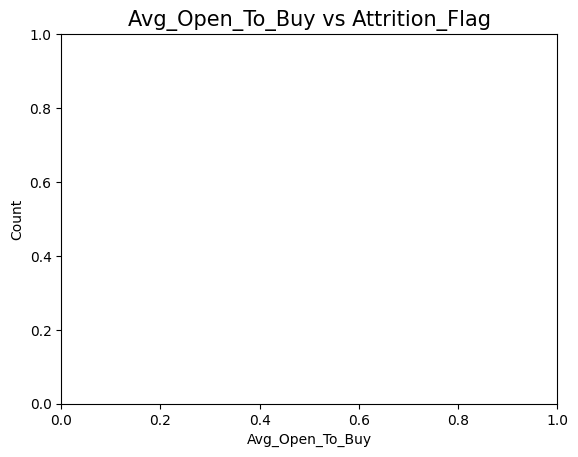

<Figure size 640x480 with 0 Axes>

In [ ]:
#Distribution plot between Attrition_Flag and vg_Open_To_Buy
distribution_plot_wrt_target(df_churn, "Avg_Open_To_Buy", "Attrition_Flag")
plt.title("Avg_Open_To_Buy vs Attrition_Flag", fontsize=15)
plt.xlabel("Avg_Open_To_Buy")
plt.ylabel("Count")
plt.show()
plt.savefig("Avg_Open_To_Buy vs Attrition_Flag.png");

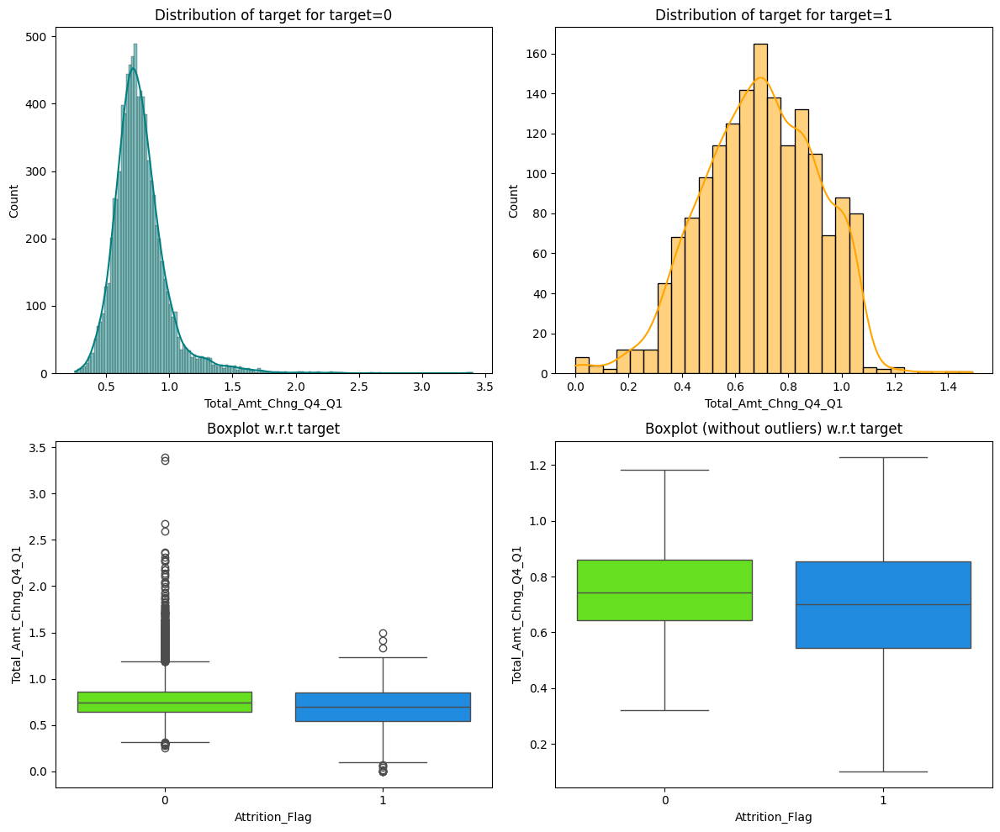

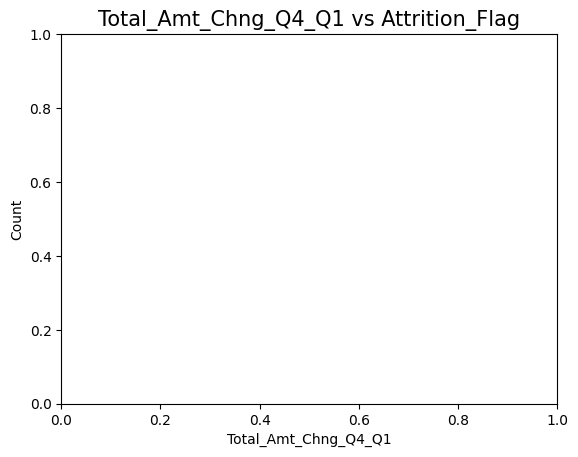

<Figure size 640x480 with 0 Axes>

In [ ]:
# Distribution plot between Attrition_Flag and Total_Amt_Chng_Q4_Q1
distribution_plot_wrt_target(df_churn, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag")
plt.title("Total_Amt_Chng_Q4_Q1 vs Attrition_Flag", fontsize=15)
plt.xlabel("Total_Amt_Chng_Q4_Q1")
plt.ylabel("Count")
plt.show()
plt.savefig("Total_Amt_Chng_Q4_Q1 vs Attrition_Flag.png");

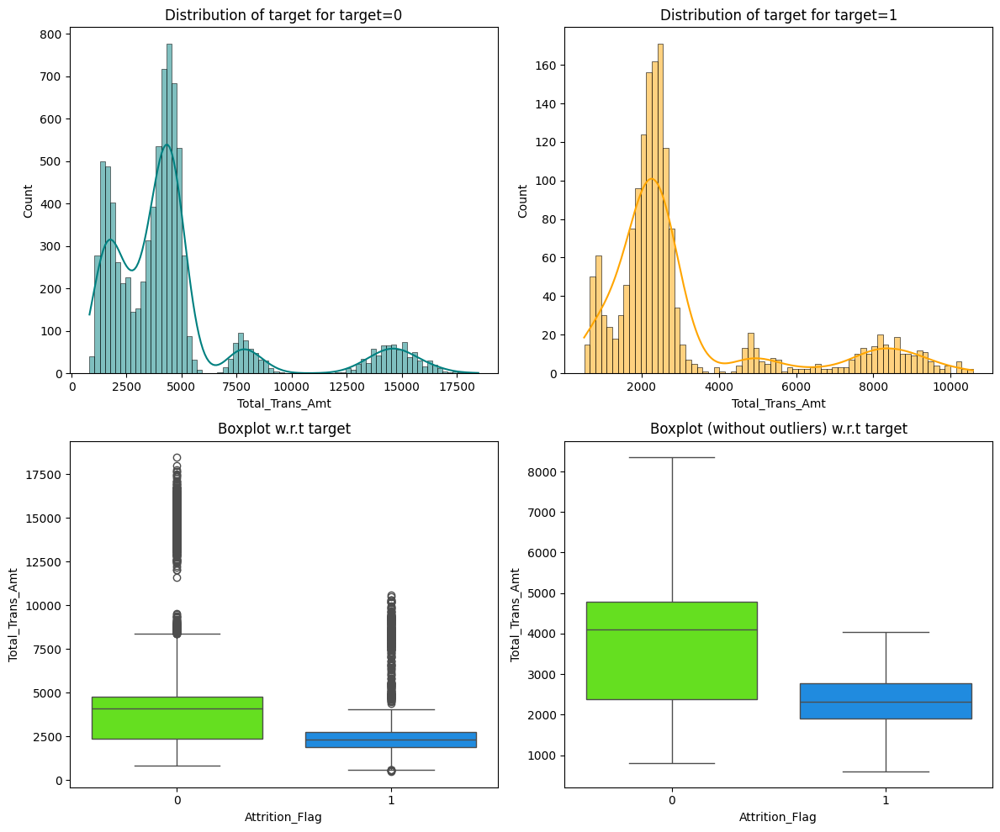

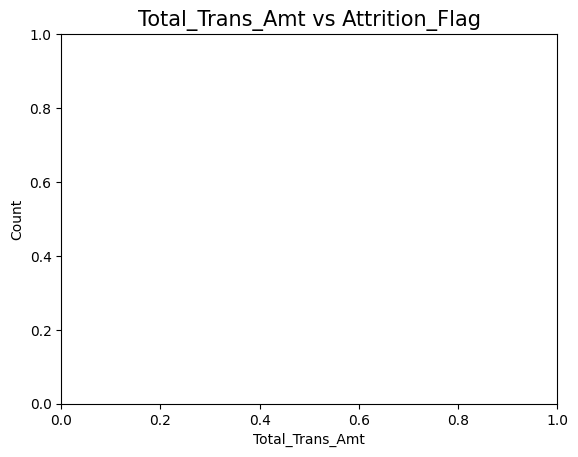

<Figure size 640x480 with 0 Axes>

In [ ]:
# Distribution plot between Attrition_Flag and otal_Trans_Amt
distribution_plot_wrt_target(df_churn, "Total_Trans_Amt", "Attrition_Flag")
plt.title("Total_Trans_Amt vs Attrition_Flag", fontsize=15)
plt.xlabel("Total_Trans_Amt")
plt.ylabel("Count")
plt.show()
plt.savefig("Total_Trans_Amt vs Attrition_Flag.png");

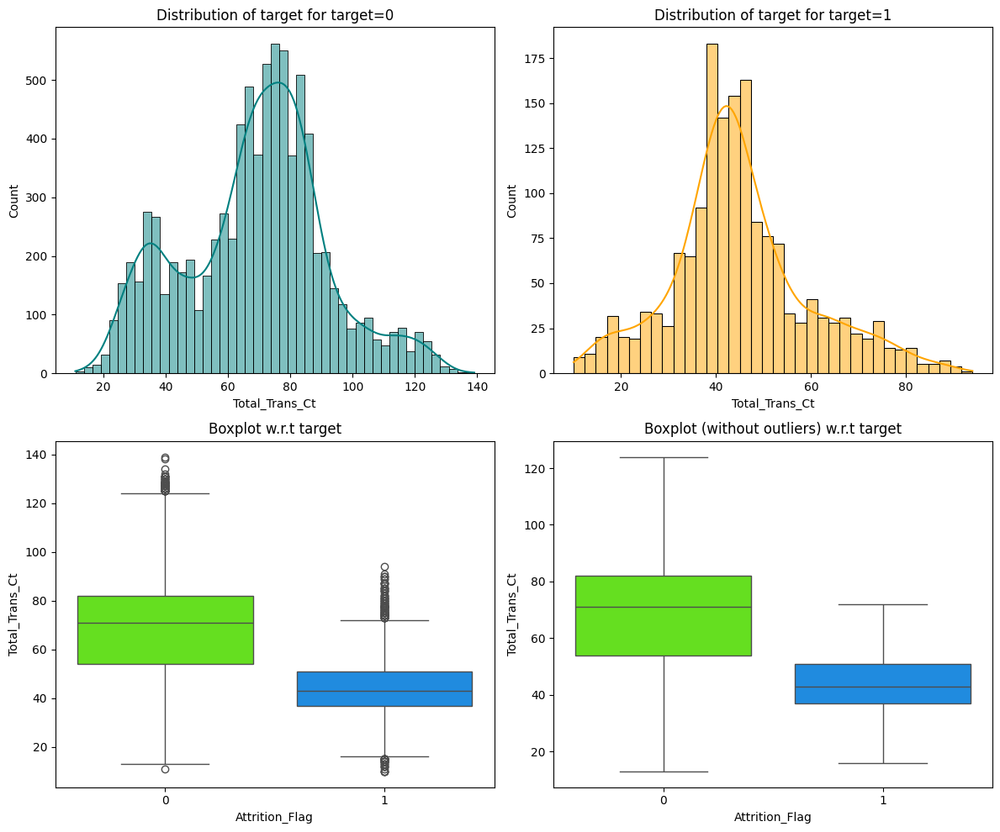

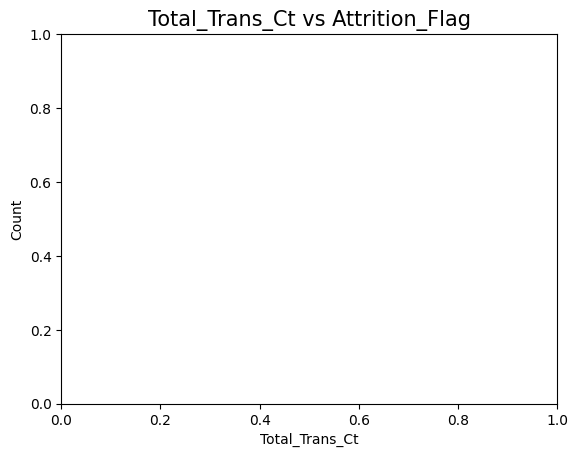

<Figure size 640x480 with 0 Axes>

In [ ]:
# Distribution plot between Attrition_Flag and Total_Trans_Ct
distribution_plot_wrt_target(df_churn, "Total_Trans_Ct", "Attrition_Flag")
plt.title("Total_Trans_Ct vs Attrition_Flag", fontsize=15)
plt.xlabel("Total_Trans_Ct")
plt.ylabel("Count")
plt.show()
plt.savefig("Total_Trans_Ct vs Attrition_Flag.png");

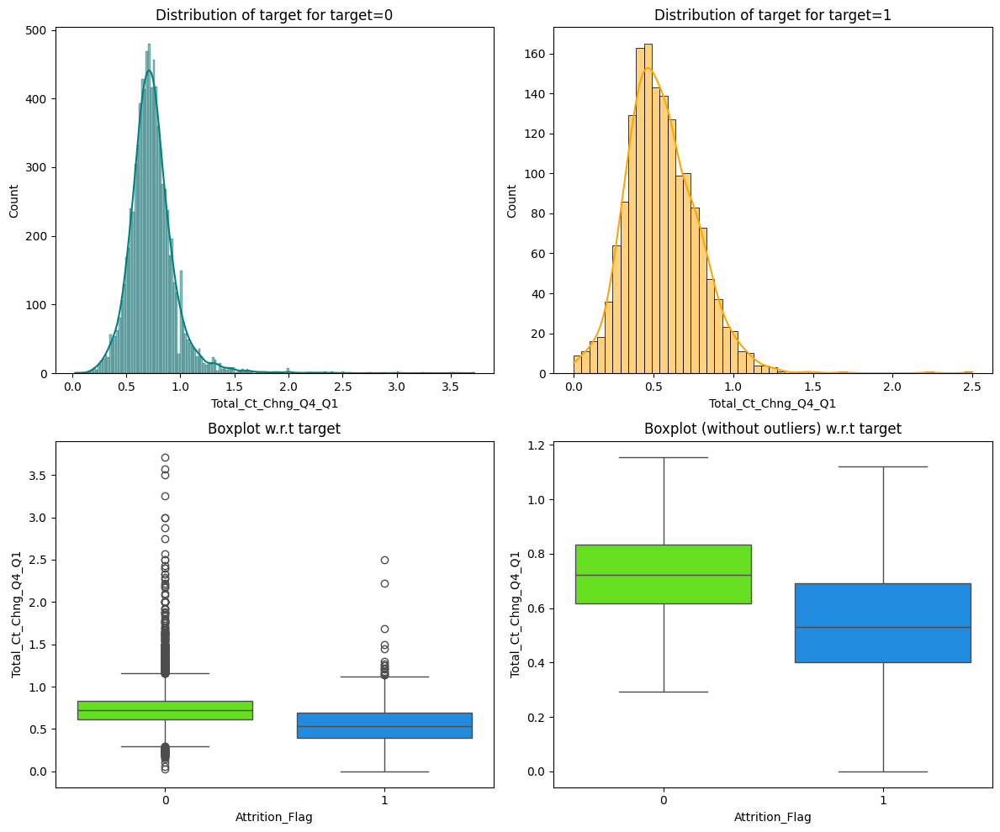

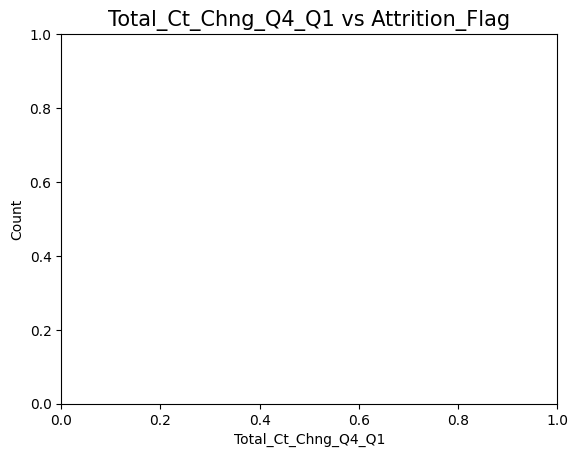

<Figure size 640x480 with 0 Axes>

In [ ]:
# Distribution plot between Attrition_Flag and Total_Ct_Chng_Q4_Q1
distribution_plot_wrt_target(df_churn, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag")
plt.title("Total_Ct_Chng_Q4_Q1 vs Attrition_Flag", fontsize=15)
plt.xlabel("Total_Ct_Chng_Q4_Q1")
plt.ylabel("Count")
plt.show()
plt.savefig("Total_Ct_Chng_Q4_Q1 vs Attrition_Flag.png");

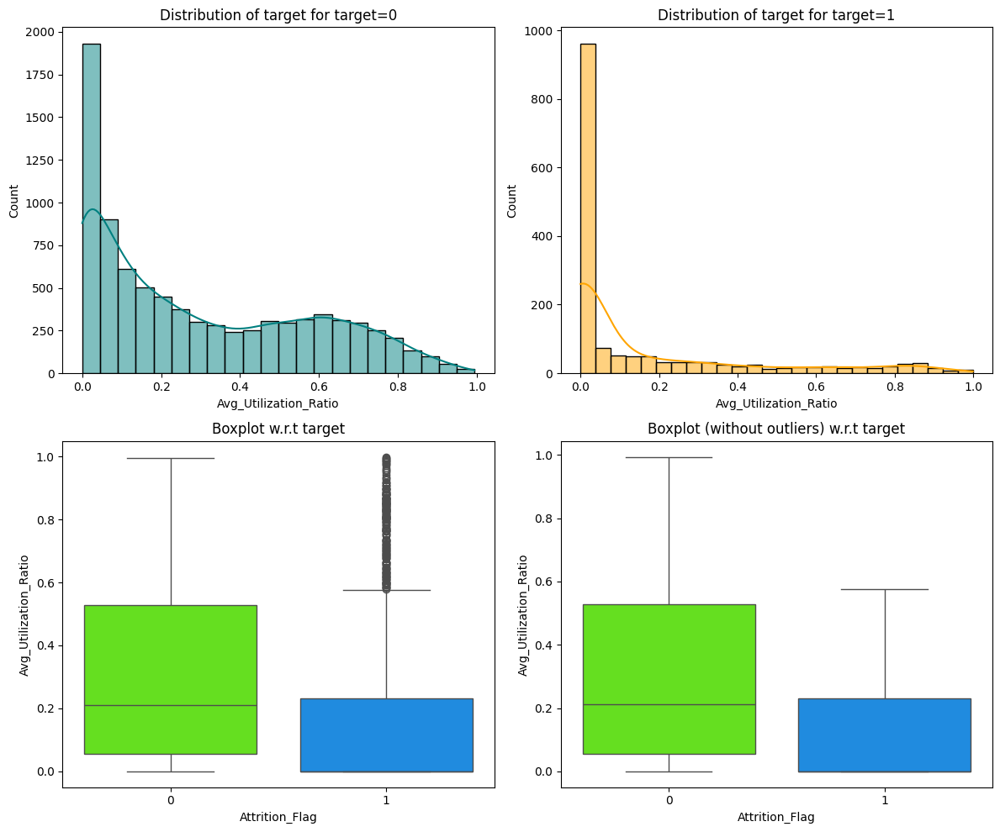

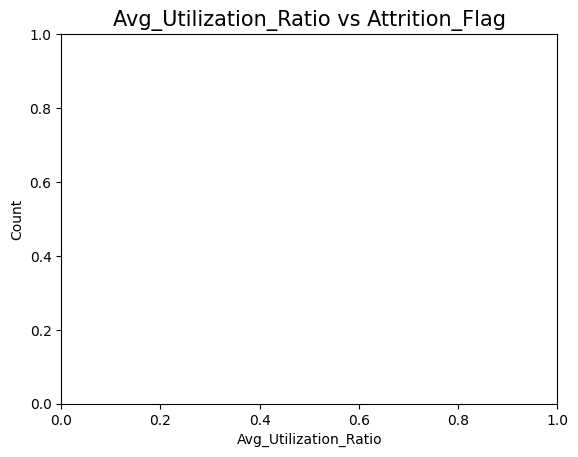

<Figure size 640x480 with 0 Axes>

In [ ]:
# Distribution plot between Attrition_Flag and Avg_Utilization_Ratio
distribution_plot_wrt_target(df_churn, "Avg_Utilization_Ratio", "Attrition_Flag")
plt.title("Avg_Utilization_Ratio vs Attrition_Flag", fontsize=15)
plt.xlabel("Avg_Utilization_Ratio")
plt.ylabel("Count")
plt.show()
plt.savefig("Avg_Utilization_Ratio vs Attrition_Flag.png");

## Data Pre-processing

In [ ]:
# Data Preparation for Modeling
data_prep = df_churn.copy()

In [ ]:
# Defining the explanatory (independent) and response (dependent) variables
X = data_prep.drop(["Attrition_Flag"], axis=1)
y = data_prep["Attrition_Flag"]
X

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [ ]:
y

,Attrition_Flag
0,0
1,0
2,0
3,0
4,0
...,...
10122,0
10123,1
10124,1
10125,1


In [ ]:
data_prep['Income_Category'].replace("NaN", np.nan, inplace= True)

In [ ]:
# Splitting data in train, validation and test sets
# Initial split in temporary and test set(75:25)
X_temp, X_test, y_temp, y_test = train_test_split(X, # specifying the independent variables
                                                    y, # specifying the dependent variables
                                                    test_size=0.25, #specifying the size of test set as a fraction
                                                    stratify=y, #specifying the target variable for stratification
                                                    random_state=1 #specifying the random state for reproducibility
                                                    )
# Split temporary into training and validation set(80:20)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.20, random_state=1, stratify=y_temp) ## Complete the code to split the data into train test in the ratio 75:25

print("Shape of Training set : ", X_train.shape)
print("Shape of Validation set : ", X_val.shape)
print("Shape of test set : ", X_test.shape, '\n')

print("Percentage of classes in training set:")
print(100*y_train.value_counts(normalize=True), '\n')

print("Percentage of classes in validation set:")
print(100*y_val.value_counts(normalize=True), '\n')

print("Percentage of classes in test set:")
print(100*y_test.value_counts(normalize=True))


Shape of Training set :  (6076, 19)
Shape of Validation set :  (1519, 19)
Shape of test set :  (2532, 19) 

Percentage of classes in training set:
Attrition_Flag
0    83.936801
1    16.063199
Name: proportion, dtype: float64 

Percentage of classes in validation set:
Attrition_Flag
0    83.936801
1    16.063199
Name: proportion, dtype: float64 

Percentage of classes in test set:
Attrition_Flag
0    83.92575
1    16.07425
Name: proportion, dtype: float64


## Missing value imputation




In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6076 entries, 5943 to 3196
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Customer_Age              6076 non-null   int64   
 1   Gender                    6076 non-null   category
 2   Dependent_count           6076 non-null   int64   
 3   Education_Level           5149 non-null   category
 4   Marital_Status            5626 non-null   category
 5   Income_Category           6076 non-null   category
 6   Card_Category             6076 non-null   category
 7   Months_on_book            6076 non-null   int64   
 8   Total_Relationship_Count  6076 non-null   int64   
 9   Months_Inactive_12_mon    6076 non-null   int64   
 10  Contacts_Count_12_mon     6076 non-null   int64   
 11  Credit_Limit              6076 non-null   float64 
 12  Total_Revolving_Bal       6076 non-null   int64   
 13  Avg_Open_To_Buy           6076 non-null   float64 

In [ ]:
fix_col=['Marital_Status', 'Education_Level']

imputer= SimpleImputer(strategy='most_frequent')

X_train[fix_col]=imputer.fit_transform(X_train[fix_col])
X_val[fix_col]=imputer.transform(X_val[fix_col])
X_test[fix_col]=imputer.transform(X_test[fix_col])

In [ ]:
print(X_train.isna().sum())
print("-" * 50)
print(X_val.isna().sum())
print("-" * 50)
print(X_test.isna().sum())
print("-" * 50)

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
--------------------------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_

In [ ]:
cols = X_train.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train[i].value_counts())
    print("*" * 50)

Gender
F    3232
M    2844
Name: count, dtype: int64
**************************************************
Education_Level
Graduate         2792
High School      1218
Uneducated        859
College           609
Post-Graduate     319
Doctorate         279
Name: count, dtype: int64
**************************************************
Marital_Status
Married     3260
Single      2382
Divorced     434
Name: count, dtype: int64
**************************************************
Income_Category
Less than $40K    2126
$40K - $60K       1086
$80K - $120K       929
$60K - $80K        826
abc                672
$120K +            437
Name: count, dtype: int64
**************************************************
Card_Category
Blue        5682
Silver       314
Gold          67
Platinum      13
Name: count, dtype: int64
**************************************************


In [ ]:
cols = X_val.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_val[i].value_counts())
    print("*" * 50)

Gender
F    797
M    722
Name: count, dtype: int64
**************************************************
Education_Level
Graduate         693
High School      296
Uneducated       252
College          151
Post-Graduate     69
Doctorate         58
Name: count, dtype: int64
**************************************************
Marital_Status
Married     825
Single      585
Divorced    109
Name: count, dtype: int64
**************************************************
Income_Category
Less than $40K    551
$40K - $60K       252
$80K - $120K      231
$60K - $80K       219
abc               157
$120K +           109
Name: count, dtype: int64
**************************************************
Card_Category
Blue        1407
Silver        93
Gold          18
Platinum       1
Name: count, dtype: int64
**************************************************


In [ ]:
cols = X_test.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_test[i].value_counts())
    print("*" * 50)

Gender
F    1329
M    1203
Name: count, dtype: int64
**************************************************
Education_Level
Graduate         1162
High School       499
Uneducated        376
College           253
Post-Graduate     128
Doctorate         114
Name: count, dtype: int64
**************************************************
Marital_Status
Married     1351
Single       976
Divorced     205
Name: count, dtype: int64
**************************************************
Income_Category
Less than $40K    884
$40K - $60K       452
$80K - $120K      375
$60K - $80K       357
abc               283
$120K +           181
Name: count, dtype: int64
**************************************************
Card_Category
Blue        2347
Silver       148
Gold          31
Platinum       6
Name: count, dtype: int64
**************************************************


##Encoding categorical values

In [ ]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_val.shape, X_test.shape)

(6076, 30) (1519, 30) (2532, 30)


In [ ]:
X_train.shape

(6076, 30)

## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors) # predicting target values using model and independent variables
    cm = confusion_matrix(target, y_pred) # compute confusion matrix comparing true target values with predicted values
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]         #create labels for each cell in the confusion matrix with both count and percentage

    ).reshape(2, 2)  #reshaping to a matrix

    plt.figure(figsize=(6, 4)) #set figure size for plot
    sns.heatmap(cm, annot=labels, fmt="") # plot confusion matirx as a heatmap with the labels
    plt.ylabel("True label") # set label for true values(Y-axis)
    plt.xlabel("Predicted label") # set label for predicted values(X-axis)
    plt.title("Confusion Matrix") # set title for plot
    plt.show() # show plot

### Model Building with original data

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1)))
models.append(("Gradient Boosting-GBM", GradientBoostingClassifier(random_state=1)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

dtree: 1.0
Bagging: 0.9795081967213115
Random forest: 1.0
AdaBoost: 0.7715163934426229
XGBoost: 1.0
Gradient Boosting-GBM: 0.8862704918032787

Validation Performance:

dtree: 0.7786885245901639
Bagging: 0.8032786885245902
Random forest: 0.75
AdaBoost: 0.7377049180327869
XGBoost: 0.8483606557377049
Gradient Boosting-GBM: 0.8155737704918032


### Model Building with Oversampled data


In [ ]:
print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))

print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))



Before Oversampling, counts of label 'Yes': 976
Before Oversampling, counts of label 'No': 5100 

After Oversampling, counts of label 'Yes': 5100
After Oversampling, counts of label 'No': 5100 

After Oversampling, the shape of train_X: (10200, 30)
After Oversampling, the shape of train_y: (10200,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1)))
models.append(("Gradient Boosting-GBM", GradientBoostingClassifier(random_state=1)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))  ## Complete the code to build models on oversampled data
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

dtree: 1.0
Bagging: 0.9978431372549019
Random forest: 1.0
AdaBoost: 0.9562745098039216
XGBoost: 1.0
Gradient Boosting-GBM: 0.9782352941176471

Validation Performance:

dtree: 0.8442622950819673
Bagging: 0.8811475409836066
Random forest: 0.819672131147541
AdaBoost: 0.889344262295082
XGBoost: 0.8811475409836066
Gradient Boosting-GBM: 0.8729508196721312


### Model Building with Undersampled data

In [ ]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape)) #Random undersampler for under sampling the data

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5100 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 30)
After Under Sampling, the shape of train_y: (1952,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1)))
models.append(("Gradient Boosting-GBM", GradientBoostingClassifier(random_state=1)))
## Complete the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

dtree: 1.0
Bagging: 0.9959016393442623
Random forest: 1.0
AdaBoost: 0.9375
XGBoost: 1.0
Gradient Boosting-GBM: 0.9846311475409836

Validation Performance:

dtree: 0.9016393442622951
Bagging: 0.9262295081967213
Random forest: 0.9344262295081968
AdaBoost: 0.9016393442622951
XGBoost: 0.9549180327868853
Gradient Boosting-GBM: 0.9508196721311475


##Observations:
GBM and AdaBoost has best performance followed by Bagging method with the undersampled data.

Random Forest, Decision Tree and XGBoost are showing overfitted training data so we are not proceeding with these.

Therefore, we will tune the model generated by GBM and AdaBoost methods.

### HyperparameterTuning

#### Sample Parameter Grids

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

#### Tuning AdaBoost model with original data


In [ ]:
# defining model
Model= AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ]
}

# Type of scoring to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

# Fitting parameters in randomSearchCV
randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.1, 'estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.8124960753532182:


In [ ]:
tuned_adb = AdaBoostClassifier(random_state=1, n_estimators=100, learning_rate=0.05, estimator=DecisionTreeClassifier(max_depth=2, random_state=1))
tuned_adb.fit(X_train, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2,
                                                    random_state=1),
                   learning_rate=0.05, n_estimators=100, random_state=1)

#### Tuning AdaBoost model with undersampled data


In [ ]:
# defining model
Model= AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ]
}

# Type of scoring to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

# Fitting parameters in randomSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.1, 'estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.9477394034536892:


In [ ]:
tuned_adb_un = AdaBoostClassifier(random_state=1, n_estimators=100, learning_rate=0.05, estimator=DecisionTreeClassifier(max_depth=2, random_state=1))
tuned_adb_un.fit(X_train_un, y_train_un)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2,
                                                    random_state=1),
                   learning_rate=0.05, n_estimators=100, random_state=1)

In [ ]:
# Checking Model's performance on training set
adabst_train= model_performance_classification_sklearn(tuned_adb, X_train, y_train)
adabst_train

,Accuracy,Recall,Precision,F1
0,0.91524,0.494877,0.956436,0.652262


In [ ]:
# Checking Model's performance on training set
adabst_val= model_performance_classification_sklearn(tuned_adb, X_val, y_val)
adabst_val

,Accuracy,Recall,Precision,F1
0,0.906517,0.471311,0.898438,0.61828


#### Tuning GBM model with original data

In [ ]:
# defining model
Model= GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Type of scoring to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

# Fitting parameters in randomSearchCV
randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'n_estimators': 100, 'max_features': 0.7, 'learning_rate': 0.05, 'init': DecisionTreeClassifier(random_state=1)} with CV score=0.7940711669283098:


In [ ]:
tuned_gbm = GradientBoostingClassifier(random_state=1, n_estimators=100, learning_rate=0.05, subsample=0.7, max_features=0.5)
tuned_gbm.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.05, max_features=0.5, random_state=1,
                           subsample=0.7)

In [ ]:
# defining model
Model= GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Type of scoring to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

# Fitting parameters in randomSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'n_estimators': 50, 'max_features': 1, 'learning_rate': 0.05, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9006174777603349:


In [ ]:
tuned_gbm_un = GradientBoostingClassifier(random_state=1, n_estimators=100, learning_rate=0.05, subsample=0.7, max_features=0.5)
tuned_gbm_un.fit(X_train_un, y_train_un)

GradientBoostingClassifier(learning_rate=0.05, max_features=0.5, random_state=1,
                           subsample=0.7)

In [ ]:
# Checking Model's performance on training set
gbm_train= model_performance_classification_sklearn(tuned_gbm, X_train, y_train)
gbm_train

,Accuracy,Recall,Precision,F1
0,0.959842,0.788934,0.95297,0.863229


In [ ]:
# Checking Model's performance on validation set
gbm_val= model_performance_classification_sklearn(tuned_gbm, X_val, y_val)
gbm_val

,Accuracy,Recall,Precision,F1
0,0.945359,0.72541,0.917098,0.810069


## Model Comparison and Final Model Selection

In [ ]:
#training performance comparision_models
model_train_df = pd.concat([adabst_train.T, gbm_train.T], axis=1)
model_train_df.columns = ['AdaBoost', 'GBM']
model_train_df#

,AdaBoost,GBM
Accuracy,0.915240,0.959842
Recall,0.494877,0.788934
Precision,0.956436,0.952970
F1,0.652262,0.863229


In [ ]:
#validation performance_models
model_val_df = pd.concat([adabst_val.T, gbm_val.T], axis=1)
model_val_df.columns = ['AdaBoost', 'GBM']
model_val_df

,AdaBoost,GBM
Accuracy,0.906517,0.945359
Recall,0.471311,0.725410
Precision,0.898438,0.917098
F1,0.618280,0.810069


### Test set final performance

In [ ]:
gbm_test= model_performance_classification_sklearn(tuned_gbm, X_test, y_test)
gbm_test

,Accuracy,Recall,Precision,F1
0,0.951027,0.769042,0.912536,0.834667


## Important Features


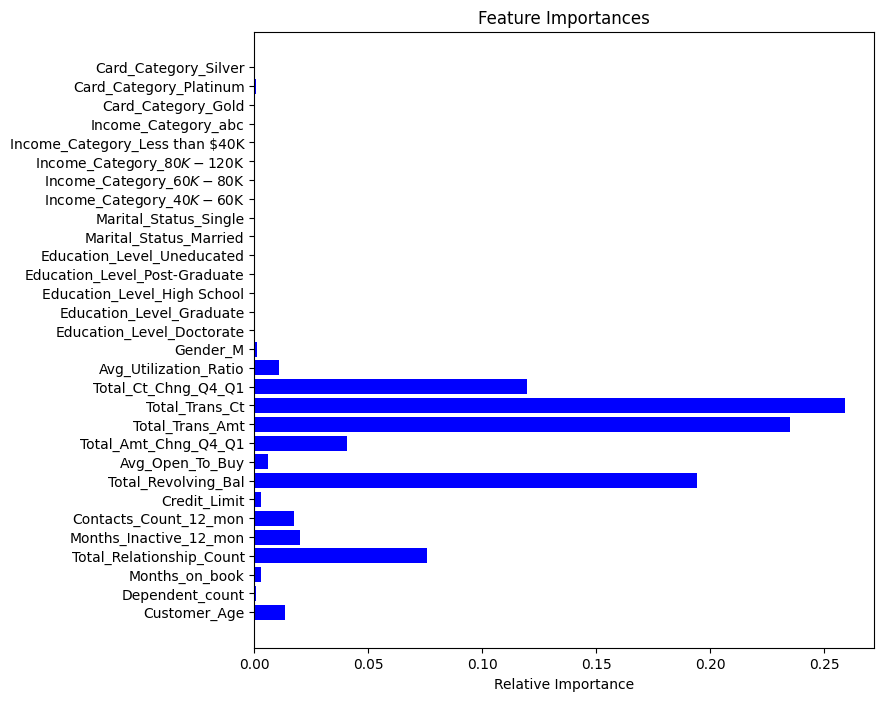

<Figure size 640x480 with 0 Axes>

In [ ]:
feature_names = list(X_train.columns)
imp_features = tuned_gbm.feature_importances_,
indices= np.argsort(imp_features)

plt.figure(figsize=(8,8))
plt.title('Feature Importances')
plt.barh(range(len(indices[0])), imp_features[0], color='b', align='center')
plt.yticks(range(len(indices[0])), feature_names)
plt.xlabel('Relative Importance')
plt.show()
plt.tight_layout()
plt.savefig('feature_importance.png')


# Business Insights and Conclusions

##Observations:

###Actionable Insights

As per above analysis, GBM model is the best classification model that will help the bank improve its services so that customers do not renounce their credit cards.

Customers with low monthly transaction counts or amounts are at higher risk of churn. These users may not find sufficient value in their credit cards.

Important features which shows high risk of churn are Total_trans_ct, Total_trans_Amnt,Total_ct_chng_Q4_Q1,Total_Revolving_Bal, Total_Relationship_count,Total_amt_chng_Q4_Q1.


## Recommendations
1. Loyalty Program Involvement
The churn rate is lower for active members of loyalty programs (such as reward points and rebates). Customers who are actively utilizing their cards perceive real advantages.

2. Churn Behavior and Demographics
If older consumers spend less or show less interest in generating activities, they may be not as profitable even though they are less likely to churn.
While younger customers may churn if the card does not align with their lifestyle or provide competitive benefits like online shopping rewards or travel points.

3. Enhance Digital Elements
Provide user-friendly online and mobile banking options to improve the general client experience.
Include extra tools like fraud alerts, customized budget suggestions, and cost trackers.

4. Active Customer Service
To proactively contact clients exhibiting indications of disengagement (such as fewer transactions or complaints), form a churn prevention team.
Make sure clients feel heard and appreciated during discussions, and expedite response times.

***